# **RECONOCIMIENTO DE FORMAS**

- **Alumno 1:** Carlos Jiménez Martín - 160190
- **Alumno 2:** Enrique González Rodríguez - 160329

# Práctica 1 Reconocimiento de Formas: Clasificador de la distancia euclídea 


In [0]:

import numpy as np
from abc import abstractmethod

class Classifier:

    @abstractmethod
    def fit(self,X,y):
        pass

    @abstractmethod
    def predict(self,X):
        pass

class ClassifEuclid(Classifier):
    def __init__(self,labels=[]):
        """Constructor de la clase
        labels: lista de etiquetas de esta clase"""
        self.labels=labels
        self.centroides = None
        pass

    def fit(self,X,y):
        """Entrena el clasificador
        X: matriz numpy cada fila es un dato, cada columna una medida
        y: vector de etiquetas, tantos elementos como filas en X
        retorna objeto clasificador"""
        
        self.centroides = np.array([np.mean(X[y == i], axis=0)for i in self.labels])
        return self

    def predict(self,X):
        """Estima el grado de pertenencia de cada dato a todas las clases 
        X: matriz numpy cada fila es un dato, cada columna una medida del vector de caracteristicas. 
        Retorna una matriz, con tantas filas como datos y tantas columnas como clases tenga
        el problema, cada fila almacena los valores pertenencia de un dato a cada clase""" 
        
        return np.linalg.norm(self.centroides[:, np.newaxis] - X, axis=2)
    
    def pred_label(self,X):
        """Estima la etiqueta de cada dato. La etiqueta puede ser un entero o bien un string.
        X: matriz numpy cada fila es un dato, cada columna una medida
        retorna un vector con las etiquetas de cada dato"""
        
        return np.argmin(X, axis=0)
    
    def num_aciertos(self,X,y):
        """Cuenta el numero de aciertos del clasificador para un conjunto de datos X.
        X: matriz de datos clasificados
        y: vector de etiquetas correctas"""
        
        assert self.centroides is not None, "Error: Debes entrenar primero el clasificador"
        return (X == y).sum(), (X == y).mean() * 100



## Código para cargar la base de datos desde un fichero en drive:

In [0]:
# from google.colab import drive
# from sklearn.datasets import load_iris

# drive.mount('/content/gdrive')
# drive_dir = '/content/gdrive/My Drive/Colab Notebooks/'

# import pandas as pd
# # Cargar las características de la BD
# X = np.genfromtxt(drive_dir + 'irisData.txt', delimiter='\t')[:, :-1]
# print("X: \n" + str(X))

# # Leer las etiquetas y convertirlas a enteros
# y = np.genfromtxt(drive_dir + 'irisData.txt', dtype=str, delimiter='\t')[:, -1]
# y = pd.factorize(y)[0]
# print("y: \n" + str(y))

## Código para cargar la base de datos Iris directamente desde sklearn:

In [0]:
# IRIS
from sklearn.datasets import load_iris
dataset = load_iris()

# WINE
#from sklearn.datasets import load_wine
#dataset = load_wine()

# CANCER
#from sklearn.datasets import load_breast_cancer
#dataset = load_breast_cancer()

X = dataset.data
print("X: \n" + str(X))
y = dataset.target
print("y: \n" + str(y))

X: 
[[5.1 3.5 1.4 0.2]
 [4.9 3.  1.4 0.2]
 [4.7 3.2 1.3 0.2]
 [4.6 3.1 1.5 0.2]
 [5.  3.6 1.4 0.2]
 [5.4 3.9 1.7 0.4]
 [4.6 3.4 1.4 0.3]
 [5.  3.4 1.5 0.2]
 [4.4 2.9 1.4 0.2]
 [4.9 3.1 1.5 0.1]
 [5.4 3.7 1.5 0.2]
 [4.8 3.4 1.6 0.2]
 [4.8 3.  1.4 0.1]
 [4.3 3.  1.1 0.1]
 [5.8 4.  1.2 0.2]
 [5.7 4.4 1.5 0.4]
 [5.4 3.9 1.3 0.4]
 [5.1 3.5 1.4 0.3]
 [5.7 3.8 1.7 0.3]
 [5.1 3.8 1.5 0.3]
 [5.4 3.4 1.7 0.2]
 [5.1 3.7 1.5 0.4]
 [4.6 3.6 1.  0.2]
 [5.1 3.3 1.7 0.5]
 [4.8 3.4 1.9 0.2]
 [5.  3.  1.6 0.2]
 [5.  3.4 1.6 0.4]
 [5.2 3.5 1.5 0.2]
 [5.2 3.4 1.4 0.2]
 [4.7 3.2 1.6 0.2]
 [4.8 3.1 1.6 0.2]
 [5.4 3.4 1.5 0.4]
 [5.2 4.1 1.5 0.1]
 [5.5 4.2 1.4 0.2]
 [4.9 3.1 1.5 0.2]
 [5.  3.2 1.2 0.2]
 [5.5 3.5 1.3 0.2]
 [4.9 3.6 1.4 0.1]
 [4.4 3.  1.3 0.2]
 [5.1 3.4 1.5 0.2]
 [5.  3.5 1.3 0.3]
 [4.5 2.3 1.3 0.3]
 [4.4 3.2 1.3 0.2]
 [5.  3.5 1.6 0.6]
 [5.1 3.8 1.9 0.4]
 [4.8 3.  1.4 0.3]
 [5.1 3.8 1.6 0.2]
 [4.6 3.2 1.4 0.2]
 [5.3 3.7 1.5 0.2]
 [5.  3.3 1.4 0.2]
 [7.  3.2 4.7 1.4]
 [6.4 3.2 4.5 1.5]
 [6.9 3.

Entrenamiento, predicción y evaluación

In [0]:
# 1. Cargar los datos de la base de datos de entrenamiento

In [0]:
labels = np.unique(y)
clasEucl = ClassifEuclid(labels)

In [0]:
# 2. Entrenar el clasificador

In [0]:
clasEucl.fit(X,y)

In [0]:
# 3. Predecir empleando la base de datos de entrenamiento (X)

In [0]:
pM = clasEucl.predict(X)
print("Predict: \n" + str(pM))

pL = clasEucl.pred_label(pM)
print("Predict Label: \n" + str(pL))

Predict: 
[[0.14135063 0.44763825 0.4171091  0.52533799 0.18862662 0.67703767
  0.4151867  0.06618157 0.80745278 0.37627118 0.4824728  0.25373214
  0.50077939 0.91322505 1.01409073 1.20481534 0.6542018  0.1441527
  0.82436642 0.38933276 0.46344363 0.3286031  0.64029681 0.38259639
  0.48701129 0.45208406 0.20875823 0.21536016 0.21066561 0.40838707
  0.41373905 0.42565244 0.71552778 0.91977171 0.34982853 0.35039977
  0.52685861 0.25686572 0.76077592 0.11480418 0.18541845 1.24803045
  0.6690142  0.38675574 0.60231221 0.48205809 0.41034132 0.47199576
  0.40494444 0.14959947 3.98049997 3.57731464 4.13366423 3.01144152
  3.74779669 3.34908644 3.74283048 2.23937045 3.71181627 2.8005678
  2.60022691 3.17042268 3.08317693 3.64581678 2.51268382 3.59732957
  3.36719171 2.94753796 3.70615434 2.80841236 3.79583719 3.02383531
  3.99098735 3.60360653 3.37448959 3.56196294 4.01083283 4.20528001
  3.47401497 2.42676328 2.73795179 2.62259032 2.83096803 4.07263797
  3.33772078 3.47153856 3.87741924 3.562

In [0]:
# 4. Evaluar el clasificador calculando el porcentaje de datos correctamente clasificados

In [0]:
(total, porcentaje) = clasEucl.num_aciertos(pL,y)
print("Numero de aciertos: " + str(total))
print("Porcentaje de aciertos: " + str(porcentaje))


Numero de aciertos: 139
Porcentaje de aciertos: 92.66666666666666


Repite el proceso anterior para las base de datos "wine" y "cancer"


Resultados de los tres experimentos:

| Base de datos | Número de aciertos | Porcentaje de aciertos |
| --- | --- | --- |
| Iris   | 139 | 0,92666 |
| Wine   | 129 | 0,72472 |
| Cancer | 507 | 0,89104 |


# Práctica 2 Reconocimiento de Formas: Clasificador de la distancia euclídea (2)

* **Alumno 1**: Carlos Jiménez Martín - 160190
* **Alumno 2**: Enrique Gonzalez Rodríguez - 160329


In [0]:

import numpy as np
from abc import abstractmethod

class Classifier:

    @abstractmethod
    def fit(self,X,y):
        pass

    @abstractmethod
    def predict(self,X):
        pass

class ClassifEuclid(Classifier):
    def __init__(self,labels=[]):
        """Constructor de la clase
        labels: lista de etiquetas de esta clase"""
        self.labels=labels
        self.centroides = None
        pass

    def fit(self,X,y):
        """Entrena el clasificador
        X: matriz numpy cada fila es un dato, cada columna una medida
        y: vector de etiquetas, tantos elementos como filas en X
        retorna objeto clasificador"""
        
        self.centroides = np.array([np.mean(X[y == i], axis=0)for i in labels])
        return self

    def predict(self,X):
        """Estima el grado de pertenencia de cada dato a todas las clases 
        X: matriz numpy cada fila es un dato, cada columna una medida del vector de caracteristicas. 
        Retorna una matriz, con tantas filas como datos y tantas columnas como clases tenga
        el problema, cada fila almacena los valores pertenencia de un dato a cada clase""" 
        
        return np.linalg.norm(self.centroides[:, np.newaxis] - X, axis=2)
    
    def pred_label(self,X):
        """Estima la etiqueta de cada dato. La etiqueta puede ser un entero o bien un string.
        X: matriz numpy cada fila es un dato, cada columna una medida
        retorna un vector con las etiquetas de cada dato"""
        
        return self.labels[np.argmin(X, axis=0)]
    
    def num_aciertos(self,X,y):
        """Cuenta el numero de aciertos del clasificador para un conjunto de datos X.
        X: matriz de datos clasificados
        y: vector de etiquetas correctas"""
        
        assert self.centroides is not None, "Error: Debes entrenar primero el clasificador"
        return (X == y).sum(), (X == y).mean() * 100


## MNIST Database (Modified National Institute of Standards and Technology database)
MNIST es una base de datos de texto manuscrito, que se usa de forma clásica para entrenar sistemas de procesado de imágenes. En esta práctica debes tratar de predecir el dígito de cada imagen.

In [0]:
# # Loading MNIST from Drive
# from google.colab import drive
# from sklearn.datasets import load_iris

# drive.mount('/content/gdrive')
# drive_dir = '/content/gdrive/My Drive/Colab Notebooks/MNIST/'

# # Isntall idx2numpy to read the data
# !pip install idx2numpy 
# import idx2numpy
# import numpy as np

# # Load the images
# file = drive_dir + 'train-images-idx3-ubyte/data'
# X = idx2numpy.convert_from_file(file)

# # Reshape the data. Each pixel is considered as a feature. 28 x 28 = 784
# X = X.reshape(X.shape[0], -1)
# print("X: \n" + str(X))

# # Load the labels
# file = drive_dir + 'train-labels-idx1-ubyte/data'
# y = idx2numpy.convert_from_file(file)

# print("y: \n" + str(y))


In [0]:
import numpy as np
from sklearn.datasets import fetch_openml

# Cargamos MNIST desde internet ( https://www.openml.org/d/554 )
all_X, all_y = fetch_openml('mnist_784', version=1, return_X_y=True, cache=True)
X = all_X[:60000]
y = all_y[:60000]
print("X: \n" + str(X))
print("y: \n" + str(y))

X: 
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
y: 
['5' '0' '4' ... '5' '6' '8']


Label: 5


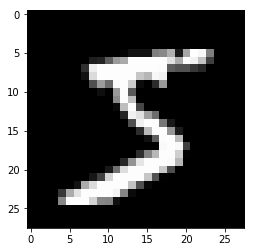

In [0]:
# Vamos a visualizar alguna de las imágenes de la BD de MNIST
import matplotlib.pyplot as plt

# Imprimamos el primer ejemplo
example_idx = 0
plt.imshow(X[example_idx].reshape(28, 28), cmap='gray')
print("Label: " + str(y[example_idx]))

Ahora usamos nuestro clasificador de la distancia euclídea para predecir la base de datos:

In [0]:
# 2. Entrenar el clasificador
labels = np.unique(y)
clasEucl = ClassifEuclid(labels)
clasEucl.fit(X,y)

# 3. Predecir empleando la base de datos de entrenamiento (X)
pM = clasEucl.predict(X)
print("\nPredict: \n" + str(pM))

pL = clasEucl.pred_label(pM)
print("\nPredict Label: \n" + str(pL))

# 4. Evaluar el clasificador calculando el porcentaje de datos correctamente clasificados
(total, porcentaje) = clasEucl.num_aciertos(pL,y)
print("\nNumero de aciertos: " + str(total))
print("Porcentaje de aciertos: " + str(porcentaje))


Predict: 
[[2073.83049639 1342.82071995 2345.72627735 ... 2192.56391416
  1873.29578645 2056.74598832]
 [2115.33184231 2420.80629431 2230.09508241 ... 2072.14413802
  2011.05145043 1926.64539489]
 [2021.55020566 2196.70610827 2121.336168   ... 2236.20432088
  1886.91028839 1884.88851048]
 ...
 [1988.22632363 2251.52028415 2095.37224631 ... 1893.77885032
  1975.58993301 1905.15818096]
 [1882.50416409 2153.73450908 2195.10642661 ... 1801.26674831
  2062.16684182 1727.13175206]
 [2014.29375652 2237.46548505 1981.17306868 ... 1792.0854945
  1925.42350151 1825.96565924]]

Predict Label: 
['5' '0' '4' ... '5' '6' '8']

Numero de aciertos: 48479
Porcentaje de aciertos: 80.79833333333333


## Isolet Dataset (Isolated Letter Speech Recognition)
Tratar de predecir ahora esta otra base de datos sobre reconociento de voz.

In [0]:
import pandas as pd

# 1. Cargar los datos de la base de datos de entrenamiento
X, y = fetch_openml('isolet', version=1, return_X_y=True, cache=True)
y = pd.factorize(y)[0]

# 2. Entrenar el clasificador
labels = np.unique(y)
clasEucl = ClassifEuclid(labels)
clasEucl.fit(X,y)

# 3. Predecir empleando la base de datos de entrenamiento (X)
pM = clasEucl.predict(X)
print("\nPredict: \n" + str(pM))

pL = clasEucl.pred_label(pM)
print("\nPredict Label: \n" + str(pL))

# 4. Evaluar el clasificador calculando el porcentaje de datos correctamente clasificados
(total, porcentaje) = clasEucl.num_aciertos(pL,y)
print("\nNumero de aciertos: " + str(total))
print("Porcentaje de aciertos: " + str(porcentaje))



Predict: 
[[10.19195419  8.53202879 12.55025149 ... 11.6728588  13.7846748
  12.88292919]
 [10.50552553  9.7370216   7.98012313 ... 14.29120691 11.74100741
  11.54823068]
 [10.82452841 12.05617872 13.33764092 ... 16.54691827  8.49849822
   7.70006661]
 ...
 [15.36825141 13.47822093 17.89638239 ... 12.50757421 18.1464324
  17.33622282]
 [14.70129426 12.57131963 16.52906015 ...  8.58349795 17.31137955
  17.44030567]
 [10.44359993 11.91130977 12.31995728 ... 16.29176107  7.19635584
   7.0068435 ]]

Predict Label: 
[15  0  4 ... 24 25 25]

Numero de aciertos: 6843
Porcentaje de aciertos: 87.7645248172374


Resultados de los tres experimentos:

| Base de datos | Número de aciertos | Porcentaje de aciertos |
| --- | --- | --- |
| Iris   | 139 | 92.667 |
| Wine   | 129 | 72.472 |
| Cancer | 507 | 89.104 |
| **MNIST**  | 48479 | 80.798 |
| **Isolet** | 6843 | 87.765 |

# Práctica 3 Reconocimiento de Formas: Clasificador Estadístico Bayesiano

* **Alumno 1**: Carlos Jiménez Martín - 160190
* **Alumno 2**: Enrique Gonzalez Rodríguez - 160329


In [0]:

import numpy as np
from abc import abstractmethod

class Classifier:

    @abstractmethod
    def fit(self,X,y):
        pass

    @abstractmethod
    def predict(self,X):
        pass

class ClassifBayesiano(Classifier):
    def __init__(self):
        """Constructor de la clase
        labels: lista de etiquetas de esta clase"""
        self.labels = None
        self.ln_apriories = None
        self.means = None
        self.ln_determinants = None
        self.inv_covs = None
        
    def fit(self,X,y):
        """Entrena el clasificador. Dado que es un clasificador Gausiano Bayesiano, 
        se aprenderán los parámetros de las gausianas de cada clase.
        X: matriz numpy cada fila es un dato, cada columna una característica
        y: vector de etiquetas, tantos elementos como filas en X
        retorna objeto clasificador"""
        assert X.ndim == 2 and X.shape[0] == len(y)
        
        # Contar cuantos ejemplos hay de cada etiqueta
        self.labels, labels_count = np.unique(y, return_counts=True)
        print("Labels: ", self.labels)
        
        # Usando el contador de ejemplos de cada etiqueta, calcular el logaritmo neperiano de las probabilidades a-priori
        self.ln_apriories = np.log(labels_count/y.size)
        print("Ln probs: ", self.ln_apriories)
        
        # Calcular para los ejemplos de cada clase, la media de cada una de sus características (centroide)
        self.means = np.array([np.mean(X[y == i], axis=0) for i in np.unique(y)])
        
        print("Medias: ", self.means)
        
        # Sustraer a los ejemplos de cada clase su media y calcular su matriz de covarianzas (puedes emplear compresión de listas) 
        self.covs = np.array([np.cov(X[y==np.unique(y)[i]]-self.means[i], rowvar=False) for i in range(len(self.labels))])
        print("Matriz de covarianzas: ", self.covs)
        
        # Para cada una de las clases, calcular el logaritmo neperiano de su matriz de covarianzas (puedes emplear compresión de listas o la función map)
        self.ln_determinants = np.log(np.linalg.det(self.covs))
        print("Ln de la matriz: ", self.ln_determinants)
        
        # Para cada una de las clases, calcular la inversa de su matriz de covarianzas (puedes emplear compresión de listas o la función map)
        self.inv_covs = np.linalg.inv(self.covs)
        print("Inversa de la matriz: ", self.inv_covs)

        return self

    def predict(self,X):
        """Estima el grado de pertenencia de cada dato a todas las clases 
        X: matriz numpy cada fila es un dato, cada columna una medida del vector de caracteristicas. 
        Retorna una matriz, con tantas filas como datos y tantas columnas como clases tenga
        el problema, cada fila almacena los valores pertenencia de un dato a cada clase""" 
        assert self.means is not None, "Error: The classifier needs to be fitted. Please call fit(X, y) method."
        assert X.ndim == 2 and X.shape[1] == self.means.shape[1]

        # Resta la media de cada clase a cada ejemplo en X
        X_mean0 = np.array([X-self.means[i] for i in range(len(self.means))])
        print("Resta de X con las medias: ", X_mean0)
        a = -(1/2)*self.ln_determinants
        b = np.matmul(np.expand_dims(X_mean0, 2), np.expand_dims(self.inv_covs,1))
        c = - (1/2)*np.matmul(b,  np.expand_dims(X_mean0, 3))
        print("Matmul: ", c, c.shape)
        # Calcula el logaritmo de la función de decisión gausiana 
        # Transparencias de Métodos paramétricos de clasificación: página 14:
        # -(1/2)ln|Sigma_i| - (1/2)*(x- mu_i)^T Sigma_i^-1 (x- mu_i) + lnP(alpha_i)
        grado_de_pertenencia = -(1/2)*self.ln_determinants - (1/2)*np.squeeze(np.matmul(np.matmul(np.expand_dims(X_mean0, 2), np.expand_dims(self.inv_covs,1)),  np.expand_dims(X_mean0, 3))).T + self.ln_apriories
        return grado_de_pertenencia 

    def pred_label(self,X):
        """Estima la etiqueta de cada dato. La etiqueta puede ser un entero o bien un string.
        X: matriz numpy cada fila es un dato, cada columna una medida
        retorna un vector con las etiquetas de cada dato"""
        print("X shape", X.shape)
        return self.labels[np.argmax(X, axis=1)]


## Iris Dataset
Carga, entrenamiento, predicción y evaluación en la base de datos de Iris:

In [0]:
  # 1. Cargar los datos de la base de datos de entrenamiento
from sklearn.datasets import load_iris
dataset = load_iris()
X = dataset.data
#print("X: \n" + str(X))
y = dataset.target
#print("y: \n" + str(y))

# 2. Entrenar el clasificador
clas = ClassifBayesiano()
clas.fit(X,y)

# 3. Predecir empleando la base de datos de entrenamiento (X)
p = clas.predict(X)
l = clas.pred_label(p)
print("Etiquetas predichas: ", l)

# 4. Evaluar el clasificador calculando el porcentaje de datos correctamente clasificados
print("Numero de aciertos: ",  (l == y).sum())
print("Porcentaje de aciertos: ", (l == y).mean() * 100)

Labels:  [0 1 2]
Ln probs:  [-1.09861229 -1.09861229 -1.09861229]
Medias:  [[5.006 3.428 1.462 0.246]
 [5.936 2.77  4.26  1.326]
 [6.588 2.974 5.552 2.026]]
Matriz de covarianzas:  [[[0.12424898 0.09921633 0.0163551  0.01033061]
  [0.09921633 0.1436898  0.01169796 0.00929796]
  [0.0163551  0.01169796 0.03015918 0.00606939]
  [0.01033061 0.00929796 0.00606939 0.01110612]]

 [[0.26643265 0.08518367 0.18289796 0.05577959]
  [0.08518367 0.09846939 0.08265306 0.04120408]
  [0.18289796 0.08265306 0.22081633 0.07310204]
  [0.05577959 0.04120408 0.07310204 0.03910612]]

 [[0.40434286 0.09376327 0.3032898  0.04909388]
  [0.09376327 0.10400408 0.07137959 0.04762857]
  [0.3032898  0.07137959 0.30458776 0.04882449]
  [0.04909388 0.04762857 0.04882449 0.07543265]]]
Ln de la matriz:  [-13.06736033 -10.87432504  -8.92705848]
Inversa de la matriz:  [[[ 18.94343879 -12.40482616  -4.50020654  -4.77612733]
  [-12.40482616  15.57054017   1.11107914  -2.10409783]
  [ -4.50020654   1.11107914  38.77620413 -

## Wine dataset
Carga, entrenamiento, predicción y evaluación en la base de datos de Wine:

In [0]:
# 1. Cargar los datos de la base de datos de entrenamiento
from sklearn.datasets import load_wine
dataset = load_wine()
X = dataset.data
#print("X: \n" + str(X))
y = dataset.target
#print("y: \n" + str(y))

# 2. Entrenar el clasificador
clas = ClassifBayesiano()
clas.fit(X,y)

# 3. Predecir empleando la base de datos de entrenamiento (X)
p = clas.predict(X)
l = clas.pred_label(p)
print("Etiquetas predichas: ", l)

# 4. Evaluar el clasificador calculando el porcentaje de datos correctamente clasificados
print("Numero de aciertos: ",  (l == y).sum())
print("Porcentaje de aciertos: ", (l == y).mean() * 100)


Labels:  [0 1 2]
Ln probs:  [-1.10424611 -0.91910367 -1.31058254]
Medias:  [[1.37447458e+01 2.01067797e+00 2.45559322e+00 1.70372881e+01
  1.06338983e+02 2.84016949e+00 2.98237288e+00 2.90000000e-01
  1.89932203e+00 5.52830508e+00 1.06203390e+00 3.15779661e+00
  1.11571186e+03]
 [1.22787324e+01 1.93267606e+00 2.24478873e+00 2.02380282e+01
  9.45492958e+01 2.25887324e+00 2.08084507e+00 3.63661972e-01
  1.63028169e+00 3.08661972e+00 1.05628169e+00 2.78535211e+00
  5.19507042e+02]
 [1.31537500e+01 3.33375000e+00 2.43708333e+00 2.14166667e+01
  9.93125000e+01 1.67875000e+00 7.81458333e-01 4.47500000e-01
  1.15354167e+00 7.39624998e+00 6.82708333e-01 1.68354167e+00
  6.29895833e+02]]
Matriz de covarianzas:  [[[ 2.13559848e-01 -1.28912040e-02 -1.55994155e-02 -3.74628288e-01
    7.73191116e-01  6.58974576e-02  7.62144068e-02  5.06896552e-04
    5.85756867e-02  2.33696113e-01  4.30742256e-03  1.15209819e-02
    3.69194944e+01]
  [-1.28912040e-02  4.74099532e-01  4.10131502e-03  1.05250146e-01


## Breast cancer dataset
Carga, entrenamiento, predicción y evaluación en la base de datos de Breast cancer:

In [0]:
# 1. Cargar los datos de la base de datos de entrenamiento
from sklearn.datasets import load_breast_cancer
dataset = load_breast_cancer()
X = dataset.data
#print("X: \n" + str(X))
y = dataset.target
#print("y: \n" + str(y))

# 2. Entrenar el clasificador
clas = ClassifBayesiano()
clas.fit(X,y)

# 3. Predecir empleando la base de datos de entrenamiento (X)
p = clas.predict(X)
l = clas.pred_label(p)
print("Etiquetas predichas: ", l)

# 4. Evaluar el clasificador calculando el porcentaje de datos correctamente clasificados
print("Numero de aciertos: ",  (l == y).sum())
print("Porcentaje de aciertos: ", (l == y).mean() * 100)


Labels:  [0 1]
Ln probs:  [-0.98729416 -0.46614465]
Medias:  [[1.74628302e+01 2.16049057e+01 1.15365377e+02 9.78376415e+02
  1.02898491e-01 1.45187783e-01 1.60774717e-01 8.79900000e-02
  1.92908962e-01 6.26800943e-02 6.09082547e-01 1.21091462e+00
  4.32392925e+00 7.26724057e+01 6.78009434e-03 3.22811651e-02
  4.18240094e-02 1.50604717e-02 2.04724009e-02 4.06240566e-03
  2.11348113e+01 2.93182075e+01 1.41370330e+02 1.42228632e+03
  1.44845236e-01 3.74824104e-01 4.50605566e-01 1.82237311e-01
  3.23467925e-01 9.15299528e-02]
 [1.21465238e+01 1.79147619e+01 7.80754062e+01 4.62790196e+02
  9.24776471e-02 8.00846218e-02 4.60576210e-02 2.57174062e-02
  1.74185994e-01 6.28673950e-02 2.84082353e-01 1.22038011e+00
  2.00032129e+00 2.11351485e+01 7.19590196e-03 2.14382465e-02
  2.59967356e-02 9.85765266e-03 2.05838067e-02 3.63605126e-03
  1.33798011e+01 2.35150700e+01 8.70059384e+01 5.58899440e+02
  1.24959496e-01 1.82672549e-01 1.66237723e-01 7.44443445e-02
  2.70245938e-01 7.94420728e-02]]
Matr

## MNIST Database (Modified National Institute of Standards and Technology database)
MNIST es una base de datos de texto manuscrito, que se usa de forma clásica para entrenar sistemas de procesado de imágenes.

Carga, entrenamiento, predicción y evaluación en la base de datos de MNIST:

In [0]:
import pandas as pd
import numpy as np
from sklearn.datasets import fetch_openml

# 1. Cargamos MNIST desde internet ( https://www.openml.org/d/554 )
all_X, all_y = fetch_openml('mnist_784', version=1, return_X_y=True, cache=True)
X = all_X[:60000]
y = all_y[:60000]
y = pd.factorize(y)[0]

#print("X: \n" + str(X))
#print("y: \n" + str(y))

# 2. Entrenar el clasificador
clas = ClassifBayesiano()
clas.fit(X,y)

# 3. Predecir empleando la base de datos de entrenamiento (X)
p = clas.predict(X)
l = clas.pred_label(p)
print("Etiquetas predichas: ", l)

# 4. Evaluar el clasificador calculando el porcentaje de datos correctamente clasificados
print("Numero de aciertos: ",  (l == y).sum())
print("Porcentaje de aciertos: ", (l == y).mean() * 100)

Labels:  [0 1 2 3 4 5 6 7 8 9]
Ln probs:  [-2.40406426 -2.31550148 -2.32927136 -2.18598795 -2.31112142 -2.30960971
 -2.28098669 -2.31634601 -2.25936597 -2.32773198]
Medias:  [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
Matriz de covarianzas:  [[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: RuntimeWarning: divide by zero encountered in log


Ln de la matriz:  [-inf -inf -inf -inf -inf -inf -inf -inf -inf -inf]


LinAlgError: ignored

## Isolet Dataset (Isolated Letter Speech Recognition)
Carga, entrenamiento, predicción y evaluación en la base de datos de Isolet

In [0]:
import pandas as pd

# 1. Cargar los datos de la base de datos de entrenamiento
X, y = fetch_openml('isolet', version=1, return_X_y=True, cache=True)
y = pd.factorize(y)[0]
#print("X: \n" + str(X))
#print("y: \n" + str(y))

# 2. Entrenar el clasificador
# Nota: Si la matriz de covarianzas no tiene rango completo, no podrás invertirlas, 
clas = ClassifBayesiano()
clas.fit(X,y)

# 3. Predecir empleando la base de datos de entrenamiento (X)
p = clas.predict(X)
l = clas.pred_label(p)
print("Etiquetas predichas: ", l)

# 4. Evaluar el clasificador calculando el porcentaje de datos correctamente clasificados
print("Numero de aciertos: ",  (l == y).sum())
print("Porcentaje de aciertos: ", (l == y).mean() * 100)

## Resultados
Resultados de los tres experimentos:

| Base de datos | Número de aciertos | Porcentaje de aciertos |
| --- | --- | --- |
| Iris   | 147 | 98.0 |
| Wine   | 177 | 99.4382 |
| Cancer | 554 | 97.3637 |
| MNIST  | - | - |
| Isolet | - | - |

# Práctica 4 Reconocimiento de Formas: Clasificador Bayesiano Paramétrico

* **Alumno 1**: Carlos Jiménez Martín - 160190
* **Alumno 2**: Enrique Gonzalez Rodríguez - 160329


In [0]:

import numpy as np
from sklearn.covariance import ShrunkCovariance
from sklearn import preprocessing
from abc import abstractmethod
import pandas as pd
import numpy as np


class Classifier:

    @abstractmethod
    def fit(self,X,y):
        pass

    @abstractmethod
    def predict(self,X):
        pass

class ClassifBayesianoParametrico(Classifier):
    def __init__(self, share_covs=False, shrinkage=0.0):
        """Constructor de la clase
        share_covs: Indica si la matriz de covarianzas va a ser compartida entre las distintas clases.
        shrinkage: Parámetro que determina la diagonalidad de la matriz de covarianzas. Ver sklearn.covariance.ShrunkCovariance
        """
        assert 0 <= shrinkage <= 1
        self.labels = None
        self.ln_apriories = None
        self.means = None
        self.ln_determinants = None
        self.inv_covs = None
        self.share_covs = share_covs
        self.shrinkage = shrinkage
        self.scaler = preprocessing.StandardScaler()

    def fit(self, X, y):
        """Entrena el clasificador
        X: matriz numpy cada fila es un dato, cada columna una medida
        y: vector de etiquetas, tantos elementos como filas en X
        retorna objeto clasificador"""
        assert X.ndim == 2 and X.shape[0] == len(y)
        # Aseguramos que las etiquetas son numeros tal que: [0, 1, ..., N]
        y = pd.factorize(y)[0]
        # Preprocesamos los datos de entrada
        X = self.scaler.fit_transform(X)
        # Contar cuantos ejemplos hay de cada etiqueta
        self.labels, labels_count = np.unique(y, return_counts=True)
        # Usando el contador de ejemplos de cada etiqueta, calcular el logaritmo neperiano de las probabilidades a-priori
        self.ln_apriories = np.log(labels_count/y.size)
        # Calcular para los ejemplos de cada clase, la media de cada una de sus características (centroide)
        self.means = np.array([np.mean(X[y == i], axis=0) for i in np.unique(y)])
        
        if self.share_covs:
            # Restamos al dato de cada clase su centroide
            xmz = np.array([])
            for l in self.labels:
              xmz = np.append(xmz.reshape(-1, X.shape[1]), X[y==l] - self.means[l], axis=0)
            # Calcula la matriz de covarianzas empleando la clase ShrunkCovariance de sklearn
            cov =  ShrunkCovariance(shrinkage=self.shrinkage).fit(xmz).covariance_
            #cov = ShrunkCovariance(shrinkage=self.shrinkage).fit(xmz).get_precision()
            # La reproducimos tantas veces como número de clases
            covs = np.tile(cov, (len(self.labels), 1, 1))
            print("Covarianzas conjuntas: ", covs, covs.shape)
        else:
            # Calcula la matriz de covarianzas empleando la clase ShrunkCovariance de sklearn
            covs = np.array([ShrunkCovariance(shrinkage=self.shrinkage).fit(X[y==np.unique(y)[i]]-self.means[i]).covariance_ for i in range(len(self.labels))])
            print("Covarianzas por separado: ", covs, covs.shape)

        
        # Para cada una de las clases, calcular el logaritmo neperiano de su matriz de covarianzas (puedes emplear compresión de listas o la función map)
        self.ln_determinants = np.log(np.linalg.det(covs))
        if np.any(np.isinf(self.ln_determinants)):
          print("Warning: There is a covariance matrix with determinant equal zero")
        # Para cada una de las clases, calcular la inversa de su matriz de covarianzas (puedes emplear compresión de listas o la función map)
        self.inv_covs = np.linalg.inv(covs)
        
        return self

    def predict(self, X):
        """Estima el grado de pertenencia de cada dato a todas las clases
        X: matriz numpy cada fila es un dato, cada columna una medida del vector de caracteristicas.
        Retorna una matriz, con tantas filas como datos y tantas columnas como clases tenga
        el problema, cada fila almacena los valores pertenencia de un dato a cada clase"""
        assert self.means is not None, "Error: The classifier needs to be fitted. Please call fit(X, y) method."
        assert X.ndim == 2 and X.shape[1] == self.means.shape[1]

        # Preprocesamos nuestros datos
        X = self.scaler.fit_transform(X) 

        # Resta la media de cada clase a cada ejemplo en X
        X_mean0 = np.array([X-self.means[i] for i in range(len(self.means))])
        
        # Calcula el logaritmo de la función de decisión gausiana
        # Transparencias de Métodos paramétricos de clasificación: página 14:
        # -(1/2)ln|Sigma_i| - (1/2)*(x- mu_i)^T Sigma_i^-1 (x- mu_i) + lnP(alpha_i)
        grado_de_pertenencia = -(1/2)*self.ln_determinants - (1/2)*np.squeeze(np.matmul(np.matmul(np.expand_dims(X_mean0, 2), np.expand_dims(self.inv_covs,1)),  np.expand_dims(X_mean0, 3))).T + self.ln_apriories
        return grado_de_pertenencia

    def pred_label(self, X):
        """Estima la etiqueta de cada dato. La etiqueta puede ser un entero o bien un string.
        X: matriz numpy cada fila es un dato, cada columna una medida
        retorna un vector con las etiquetas de cada dato"""
        return self.labels[np.argmax(X, axis=1)]

## Iris Dataset
Carga, entrenamiento, predicción y evaluación en la base de datos de Iris:

In [0]:
# 1. Cargar los datos de la base de datos de entrenamiento
from sklearn.datasets import load_iris
dataset = load_iris()
X = dataset.data
# print("X: \n" + str(X))
y = dataset.target
# print("y: \n" + str(y))

# # 2. Entrenar el clasificador
clas = ClassifBayesianoParametrico(False, 0)
clas.fit(X,y)

# # 3. Predecir empleando la base de datos de entrenamiento (X)
pred = clas.pred_label(clas.predict(X))

# # 4. Evaluar el clasificador calculando el porcentaje de datos correctamente clasificados
print("Numero de aciertos: ",  (pred == y).sum())
print("Porcentaje de aciertos: ", (pred == y).mean() * 100)


Covarianzas por separado:  [[[0.17876968 0.27120389 0.01103828 0.01614737]
  [0.27120389 0.74619175 0.01499926 0.02761055]
  [0.01103828 0.01499926 0.00954805 0.00445008]
  [0.01614737 0.02761055 0.00445008 0.01885874]]

 [[0.38334383 0.23284619 0.12344026 0.08718685]
  [0.23284619 0.51135882 0.10597871 0.12235666]
  [0.12344026 0.10597871 0.06990787 0.05359843]
  [0.08718685 0.12235666 0.05359843 0.06640412]]

 [[0.5817693  0.25629816 0.2046943  0.07673667]
  [0.25629816 0.54010089 0.09152374 0.14143436]
  [0.2046943  0.09152374 0.09642893 0.03579813]
  [0.07673667 0.14143436 0.03579813 0.12808835]]] (3, 4, 4)
Numero de aciertos:  147
Porcentaje de aciertos:  98.0


## Wine dataset
Carga, entrenamiento, predicción y evaluación en la base de datos de Wine:

In [0]:
# 1. Cargar los datos de la base de datos de entrenamiento
from sklearn.datasets import load_wine
dataset = load_wine()
X = dataset.data
# print("X: \n" + str(X))
y = dataset.target
# print("y: \n" + str(y))

clas = ClassifBayesianoParametrico(True,0)
clas.fit(X,y)

# # 3. Predecir empleando la base de datos de entrenamiento (X)
pred = clas.pred_label(clas.predict(X))

# # 4. Evaluar el clasificador calculando el porcentaje de datos correctamente clasificados
print("Numero de aciertos: ",  (pred == y).sum())
print("Porcentaje de aciertos: ", (pred == y).mean() * 100)


Covarianzas conjuntas:  [[[ 0.39312128  0.00890991 -0.05908239 -0.03545317  0.00152915
    0.05273151  0.02759401 -0.00954646  0.03568617  0.12947247
    0.0041672  -0.00855157  0.04732576]
  [ 0.00890991  0.70313076  0.06900595  0.10991517 -0.05510842
   -0.02048335 -0.00833692  0.07235854  0.02660065 -0.09876075
   -0.1631359   0.05800016 -0.09290838]
  [-0.05908239  0.06900595  0.86794447  0.52247916  0.17398399
    0.09311265  0.10813523  0.2032998   0.01687914  0.01522548
    0.03661461  0.05538589 -0.00573335]
  [-0.03545317  0.10991517  0.52247916  0.70981454  0.067116
    0.05138009  0.07303739  0.11160395  0.04796275 -0.01299975
   -0.01273341  0.09408553 -0.03086746]
  [ 0.00152915 -0.05510842  0.17398399  0.067116    0.87561657
    0.0638367   0.04621482 -0.15967083  0.15727821  0.05292472
    0.03820805 -0.02741045  0.10469165]
  [ 0.05273151 -0.02048335  0.09311265  0.05138009  0.0638367
    0.48280388  0.25511915 -0.09819512  0.25349804  0.13559432
   -0.01012692  0.13319

## Breast cancer dataset
Carga, entrenamiento, predicción y evaluación en la base de datos de Breast cancer:

In [0]:
# 1. Cargar los datos de la base de datos de entrenamiento
from sklearn.datasets import load_breast_cancer
dataset = load_breast_cancer()
X = dataset.data
# print("X: \n" + str(X))
y = dataset.target
# print("y: \n" + str(y))

clas = ClassifBayesianoParametrico()
clas.fit(X,y)

# # 3. Predecir empleando la base de datos de entrenamiento (X)
pred = clas.pred_label(clas.predict(X))

# # 4. Evaluar el clasificador calculando el porcentaje de datos correctamente clasificados
print("Numero de aciertos: ",  (pred == y).sum())
print("Porcentaje de aciertos: ", (pred == y).mean() * 100)


Covarianzas por separado:  [[[ 8.24145462e-01  8.48460407e-02  8.11444799e-01 ...  2.44879902e-01
   -2.91489060e-01 -4.14695476e-01]
  [ 8.48460407e-02  7.69885612e-01  8.72173521e-02 ... -1.36610141e-03
   -9.24232719e-02  2.71413195e-02]
  [ 8.11444799e-01  8.72173521e-02  8.06533188e-01 ...  2.76569062e-01
   -2.50866487e-01 -3.49439236e-01]
  ...
  [ 2.44879902e-01 -1.36610141e-03  2.76569062e-01 ...  4.94835029e-01
    3.10820394e-01  3.76900816e-01]
  [-2.91489060e-01 -9.24232719e-02 -2.50866487e-01 ...  3.10820394e-01
    1.45295481e+00  8.00468982e-01]
  [-4.14695476e-01  2.71413195e-02 -3.49439236e-01 ...  3.76900816e-01
    8.00468982e-01  1.41979306e+00]]

 [[ 2.55006656e-01 -1.74165777e-02  2.44461597e-01 ...  1.17386411e-01
   -4.99658073e-02 -1.19316850e-01]
  [-1.74165777e-02  8.61906707e-01 -1.80008664e-02 ... -5.36360034e-02
   -5.32277725e-02 -4.04420777e-02]
  [ 2.44461597e-01 -1.80008664e-02  2.35874452e-01 ...  1.25698645e-01
   -4.23501710e-02 -9.45228188e-02]
  

## MNIST Database (Modified National Institute of Standards and Technology database)
MNIST es una base de datos de texto manuscrito, que se usa de forma clásica para entrenar sistemas de procesado de imágenes.

Carga, entrenamiento, predicción y evaluación en la base de datos de MNIST:

In [0]:
import pandas as pd
import numpy as np
from sklearn.datasets import fetch_openml

# Cargamos MNIST desde internet ( https://www.openml.org/d/554 )
all_X, all_y = fetch_openml('mnist_784', version=1, return_X_y=True, cache=True)
X = all_X[:60000]
y = all_y[:60000]
y = pd.factorize(y)[0]

# print("X: \n" + str(X))
# print("y: \n" + str(y))

In [0]:
clas = ClassifBayesianoParametrico(True, 0.3)
clas.fit(X,y)

# # 3. Predecir empleando la base de datos de entrenamiento (X)
pred = clas.pred_label(clas.predict(X))

# # 4. Evaluar el clasificador calculando el porcentaje de datos correctamente clasificados
print("Numero de aciertos: ",  (pred == y).sum())
print("Porcentaje de aciertos: ", (pred == y).mean() * 100)


Covarianzas conjuntas:  [[[0.24270456 0.         0.         ... 0.         0.         0.        ]
  [0.         0.24270456 0.         ... 0.         0.         0.        ]
  [0.         0.         0.24270456 ... 0.         0.         0.        ]
  ...
  [0.         0.         0.         ... 0.24270456 0.         0.        ]
  [0.         0.         0.         ... 0.         0.24270456 0.        ]
  [0.         0.         0.         ... 0.         0.         0.24270456]]

 [[0.24270456 0.         0.         ... 0.         0.         0.        ]
  [0.         0.24270456 0.         ... 0.         0.         0.        ]
  [0.         0.         0.24270456 ... 0.         0.         0.        ]
  ...
  [0.         0.         0.         ... 0.24270456 0.         0.        ]
  [0.         0.         0.         ... 0.         0.24270456 0.        ]
  [0.         0.         0.         ... 0.         0.         0.24270456]]

 [[0.24270456 0.         0.         ... 0.         0.         0.        

## Isolet Dataset (Isolated Letter Speech Recognition)
Carga, entrenamiento, predicción y evaluación en la base de datos de Isolet

In [0]:
import pandas as pd
import numpy as np
from sklearn.datasets import fetch_openml

# 1. Cargar los datos de la base de datos de entrenamiento
X, y = fetch_openml('isolet', version=1, return_X_y=True, cache=True)
y = pd.factorize(y)[0]
# print("X: \n" + str(X))
# print("y: \n" + str(y))


In [0]:
clas = ClassifBayesianoParametrico(True,0.25)
clas.fit(X,y)

# # 3. Predecir empleando la base de datos de entrenamiento (X)
pred = clas.pred_label(clas.predict(X))

# # 4. Evaluar el clasificador calculando el porcentaje de datos correctamente clasificados
print("Numero de aciertos: ",  (pred == y).sum())
print("Porcentaje de aciertos: ", (pred == y).mean() * 100)


Covarianzas conjuntas:  [[[ 0.72587115  0.33638369  0.25326459 ... -0.02925657 -0.02594215
   -0.01583081]
  [ 0.33638369  0.60266684  0.29948933 ... -0.02657257 -0.02466822
   -0.01316999]
  [ 0.25326459  0.29948933  0.5533481  ... -0.01870204 -0.0156687
   -0.01721955]
  ...
  [-0.02925657 -0.02657257 -0.01870204 ...  0.63492929  0.32340568
    0.22159429]
  [-0.02594215 -0.02466822 -0.0156687  ...  0.32340568  0.61883237
    0.32527049]
  [-0.01583081 -0.01316999 -0.01721955 ...  0.22159429  0.32527049
    0.60182314]]

 [[ 0.72587115  0.33638369  0.25326459 ... -0.02925657 -0.02594215
   -0.01583081]
  [ 0.33638369  0.60266684  0.29948933 ... -0.02657257 -0.02466822
   -0.01316999]
  [ 0.25326459  0.29948933  0.5533481  ... -0.01870204 -0.0156687
   -0.01721955]
  ...
  [-0.02925657 -0.02657257 -0.01870204 ...  0.63492929  0.32340568
    0.22159429]
  [-0.02594215 -0.02466822 -0.0156687  ...  0.32340568  0.61883237
    0.32527049]
  [-0.01583081 -0.01316999 -0.01721955 ...  0.22159

Resultados de los tres experimentos:

| Base de datos | Número de aciertos | Porcentaje de aciertos |
| --- | --- | --- |
| Iris   | 147 | 98.0 |
| Wine   | 178 | 100 |
| Cancer | 555 | 97.53953 |
| MNIST  | 52289 | 87.14833 |
| Isolet | 7488 | 96.03693 |

# Práctica 5: Reconocimiento de Formas: Evaluación de rendimiento

* **Alumno 1**: Carlos Jiménez Martín - 160190
* **Alumno 2**: Enrique Gonzalez Rodríguez - 160329


In [0]:
import numpy as np
import pandas as pd
from sklearn.covariance import ShrunkCovariance
from sklearn.base import BaseEstimator
from sklearn import preprocessing
from abc import abstractmethod


class Classifier(BaseEstimator):

    @abstractmethod
    def fit(self, X, y):
        pass
      
    @abstractmethod
    def predict(self, X):
        pass


class ClassifEuclid(Classifier):
    def __init__(self):
        """ Constructor de la clase """
        self.centroides = None
        pass

    def fit(self, X, y):
        """Entrena el clasificador
        X: matriz numpy cada fila es un dato, cada columna una medida
        y: vector de etiquetas, tantos elementos como filas en X
        retorna objeto clasificador"""
        assert X.ndim == 2 and X.shape[0] == len(y)

        # Entrena el clasificador
        self.centroides = np.array([np.mean(X[y == i], axis=0)for i in np.unique(y)])
        return self
        
    def decision_function(self, X):
        """Estima el grado de pertenencia de cada dato a todas las clases
        X: matriz numpy cada fila es un dato, cada columna una medida del vector de caracteristicas.
        Retorna una matriz, con tantas filas como datos y tantas columnas como clases tenga
        el problema, cada fila almacena los valores pertenencia de un dato a cada clase"""
        assert self.centroides is not None, "Error: The classifier needs to be fitted. Please call fit(X, y) method."
        assert X.ndim == 2 and X.shape[1] == self.centroides.shape[1]

        # Calcula y devuelve la distancia a cada centroide
        return np.linalg.norm(self.centroides[:, np.newaxis] - X, axis=2)

    def predict(self, X):
        """Estima la etiqueta de cada dato. La etiqueta puede ser un entero o bien un string.
        X: matriz numpy cada fila es un dato, cada columna una medida
        retorna un vector con las etiquetas de cada dato"""

        return np.argmin(self.decision_function(X), axis=0)

In [0]:
class ClassifBayesianoParametrico(Classifier):
    def __init__(self, share_covs=False, shrinkage=0.0):
        """Constructor de la clase
        labels: lista de etiquetas de esta clase"""
        assert 0 <= shrinkage <= 1
        self.labels = None
        self.ln_apriories = None
        self.means = None
        self.ln_determinants = None
        self.inv_covs = None
        self.share_covs = share_covs
        self.shrinkage = shrinkage
        self.scaler =preprocessing.StandardScaler()

    def fit(self, X, y):
        """Entrena el clasificador
        X: matriz numpy cada fila es un dato, cada columna una medida
        y: vector de etiquetas, tantos elementos como filas en X
        retorna objeto clasificador"""
        assert X.ndim == 2 and X.shape[0] == len(y)
        
        # Preprocesamos los datos de entrada
        X = self.scaler.fit_transform(X)
        # Contar cuantos ejemplos hay de cada etiqueta
        self.labels, labels_count = np.unique(y, return_counts=True)
        # Usando el contador de ejemplos de cada etiqueta, calcular el logaritmo neperiano de las probabilidades a-priori
        self.ln_apriories = np.log(labels_count/y.size)
        # Calcular para los ejemplos de cada clase, la media de cada una de sus características (centroide)
        self.means = np.array([np.mean(X[y == i], axis=0) for i in np.unique(y)])
        
        if self.share_covs:
            # Restamos al dato de cada clase su centroide
            xmz = np.array([])
            for l in self.labels:
              xmz = np.append(xmz.reshape(-1, X.shape[1]), X[y==l] - self.means[l], axis=0)
            # Calcula la matriz de covarianzas empleando la clase ShrunkCovariance de sklearn
            cov =  ShrunkCovariance(shrinkage=self.shrinkage).fit(xmz).covariance_
            #cov = ShrunkCovariance(shrinkage=self.shrinkage).fit(xmz).get_precision()
            # La reproducimos tantas veces como número de clases
            covs = np.tile(cov, (len(self.labels), 1, 1))
            #print("Covarianzas conjuntas: ", covs, covs.shape)
        else:
            # Calcula la matriz de covarianzas empleando la clase ShrunkCovariance de sklearn
            covs = np.array([ShrunkCovariance(shrinkage=self.shrinkage).fit(X[y==np.unique(y)[i]]-self.means[i]).covariance_ for i in range(len(self.labels))])
            #print("Covarianzas por separado: ", covs, covs.shape)

        
        # Para cada una de las clases, calcular el logaritmo neperiano de su matriz de covarianzas (puedes emplear compresión de listas o la función map)
        self.ln_determinants = np.log(np.linalg.det(covs))
        if np.any(np.isinf(self.ln_determinants)):
          print("Warning: There is a covariance matrix with determinant equal zero")
        # Para cada una de las clases, calcular la inversa de su matriz de covarianzas (puedes emplear compresión de listas o la función map)
        self.inv_covs = np.linalg.inv(covs)
        
        return self

    def decision_function(self, X):
        """Estima el grado de pertenencia de cada dato a todas las clases
        X: matriz numpy cada fila es un dato, cada columna una medida del vector de caracteristicas.
        Retorna una matriz, con tantas filas como datos y tantas columnas como clases tenga
        el problema, cada fila almacena los valores pertenencia de un dato a cada clase"""
        assert self.means is not None, "Error: The classifier needs to be fitted. Please call fit(X, y) method."
        assert X.ndim == 2 and X.shape[1] == self.means.shape[1]

        # Preprocesamos nuestros datos
        X = self.scaler.fit_transform(X) 

        # Resta la media de cada clase a cada ejemplo en X
        X_mean0 = np.array([X-self.means[i] for i in range(len(self.means))])
        
        # Calcula el logaritmo de la función de decisión gausiana
        # Transparencias de Métodos paramétricos de clasificación: página 14:
        # -(1/2)ln|Sigma_i| - (1/2)*(x- mu_i)^T Sigma_i^-1 (x- mu_i) + lnP(alpha_i)
        grado_de_pertenencia = -(1/2)*self.ln_determinants - (1/2)*np.squeeze(np.matmul(np.matmul(np.expand_dims(X_mean0, 2), np.expand_dims(self.inv_covs,1)),  np.expand_dims(X_mean0, 3))).T + self.ln_apriories
        grado_de_pertenencia = grado_de_pertenencia.reshape(X.shape[0], -1)
        return grado_de_pertenencia

    def predict(self, X):
        """Estima la etiqueta de cada dato. La etiqueta puede ser un entero o bien un string.
        X: matriz numpy cada fila es un dato, cada columna una medida
        retorna un vector con las etiquetas de cada dato"""
        # Calcula y devuelve la clase más probable
        return self.labels[np.argmax(self.decision_function(X), axis=1)]

In [0]:
def best_shrinkage_clf(X, y, k, shrinkages, share_covs):
    """
    Busca el clasificador bayesiano regularizado con el mejor shrinkage. 
    :param X: Ejemplos de la dase de datos
    :param y: Etiquetas de los ejemplos
    :param k: Número de divisiones en la validación cruzada (k-fold)
    :param shrinkages: Lista de posibles shrinkages que conforman la rejilla de búsqueda
    :param share_covs: Lista de posibles valores para share_covs que conforman la rejilla de búsqueda
    """
    from sklearn.model_selection import GridSearchCV
    cbp = ClassifBayesianoParametrico(share_covs)
    params = {'shrinkage': shrinkages, 'share_covs': share_covs}
    clf = GridSearchCV(cbp, params, n_jobs=-2, scoring='accuracy', cv=k).fit(X, y)
    best_clf = clf.best_estimator_
    # print("Srinkage scores: ", clf.cv_results_['mean_test_score'])
    result_score_mean = clf.cv_results_['mean_test_score'][clf.best_index_]
    result_score_std = clf.cv_results_['std_test_score'][clf.best_index_]
    print("\tSelected shrinkage = {}, share_covs = {}\n" \
          "\tAccuracy: {:.3f} (+/- {:.3f})".format(best_clf.shrinkage,
                                                   best_clf.share_covs,
                                                   result_score_mean,
                                                   result_score_std))
    return best_clf

## Iris Dataset
Carga, entrenamiento, predicción y evaluación en la base de datos de Iris:

In [0]:
import sklearn
from time import time
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_iris

# 1. Cargar los datos de la base de datos de entrenamiento
dataset = load_iris()
X = dataset.data
y = pd.factorize(dataset.target)[0]

# 2. Baraja los datos para hacer validación cruzada
X, y = sklearn.utils.shuffle(X, y)

# Evaluar el clasificador de la distancia eucídea usando cross validation (k-fold=5)
k = 5
print("Clasificador Euclídeo")
clfEucl = ClassifEuclid()
scores = cross_val_score(clfEucl, X, y, scoring="accuracy", cv=k)
print('Accuracy: %0.2f (+/- %0.2f)' % (scores.mean(),scores.std() * 2))

# Haz una selección de modelos para buscar shrinkage del clasificador 
# estadístico paramétrico que obtiene el mejor accuracy. Usa para ello cross validation (k-fold=5)
print("Clasificador Estadístico Paramétrico")
clf = best_shrinkage_clf(X, y, k, [0, 0.25, 0.5, 0.75, 1] , [True, False])
# Predice las muestras de la base de datos y muestra la matriz de confusión (sklearn.metrics.confusion_matrix)
mC = sklearn.metrics.confusion_matrix(y, clf.predict(X), np.unique(y))
print("Matriz de confusión: \n", mC)

Clasificador Euclídeo
Accuracy: 0.91 (+/- 0.14)
Clasificador Estadístico Paramétrico
	Selected shrinkage = 0, share_covs = False
	Accuracy: 0.973 (+/- 0.013)
Matriz de confusión: 
 [[50  0  0]
 [ 0 48  2]
 [ 0  1 49]]


## Wine dataset
Carga, entrenamiento, predicción y evaluación en la base de datos de Wine:

In [0]:
# 1. Cargar los datos de la base de datos de entrenamiento
from sklearn.datasets import load_wine
dataset = load_wine()
X = dataset.data
y = pd.factorize(dataset.target)[0]
# 2. Baraja los datos para hacer validación cruzada
X, y = sklearn.utils.shuffle(X, y)

# Evaluar el clasificador de la distancia eucídea usando cross validation (k-fold=5)
k = 5
print("Clasificador Euclídeo")
clfEucl = ClassifEuclid()
scores = cross_val_score(clfEucl, X, y, scoring="accuracy", cv=k)
print('Accuracy: %0.2f (+/- %0.2f)' % (scores.mean(),scores.std() * 2))

# Haz una selección de modelos para buscar shrinkage del clasificador 
# estadístico paramétrico que obtiene el mejor accuracy. Usa para ello cross validation (k-fold=5)
print("Clasificador Estadístico Paramétrico")
clf = best_shrinkage_clf(X, y, k, [0, 0.25, 0.5, 0.75, 1] , [True, False])
# Predice las muestras de la base de datos y muestra la matriz de confusión (sklearn.metrics.confusion_matrix)
mC = sklearn.metrics.confusion_matrix(y, clf.predict(X), np.unique(y))
print("Matriz de confusión: \n", mC)

Clasificador Euclídeo
Accuracy: 0.73 (+/- 0.12)
Clasificador Estadístico Paramétrico
	Selected shrinkage = 0, share_covs = True
	Accuracy: 0.955 (+/- 0.023)
Matriz de confusión: 
 [[59  0  0]
 [ 0 71  0]
 [ 0  0 48]]


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


## Breast cancer dataset
Carga, entrenamiento, predicción y evaluación en la base de datos de Breast cancer:

In [0]:
# 1. Cargar los datos de la base de datos de entrenamiento
from sklearn.datasets import load_breast_cancer

dataset = load_breast_cancer()
X = dataset.data
y = pd.factorize(dataset.target)[0]
X, y = sklearn.utils.shuffle(X, y)

# Evaluar el clasificador de la distancia eucídea usando cross validation (k-fold=5)
k = 5
print("Clasificador Euclídeo")
clfEucl = ClassifEuclid()
scores = cross_val_score(clfEucl, X, y, scoring="accuracy", cv=k)
print('Accuracy: %0.2f (+/- %0.2f)' % (scores.mean(),scores.std() * 2))

# Haz una selección de modelos para buscar shrinkage del clasificador 
# estadístico paramétrico que obtiene el mejor accuracy. Usa para ello cross validation (k-fold=5)
print("Clasificador Estadístico Paramétrico")
clf = best_shrinkage_clf(X, y, k, [0, 0.25, 0.5, 0.75, 1] , [True, False])
# Predice las muestras de la base de datos y muestra la matriz de confusión (sklearn.metrics.confusion_matrix)
mC = sklearn.metrics.confusion_matrix(y, clf.predict(X), np.unique(y))
print("Matriz de confusión: \n", mC)

Clasificador Euclídeo
Accuracy: 0.89 (+/- 0.02)
Clasificador Estadístico Paramétrico
	Selected shrinkage = 0.5, share_covs = True
	Accuracy: 0.961 (+/- 0.013)
Matriz de confusión: 
 [[187  25]
 [  1 356]]


In [0]:
class ExclusionSplitter:
    """Esta clase nos permite usar GridSearchCV con la evaluación por exclusion."""
    def __init__(self, train_indices, test_indices):
        self.train_indices = train_indices
        self.test_indices = test_indices

    def split(self, X, y=None, groups=None):
        return [(self.train_indices, self.test_indices)]

    def get_n_splits(self, X=None, y=None, groups=None):
        return 1


## Isolet Dataset (Isolated Letter Speech Recognition)
Carga, entrenamiento, predicción y evaluación en la base de datos de Isolet

In [0]:
import pandas as pd
import numpy as np
import os
from sklearn.datasets import fetch_openml

# Loading MNIST from Drive
from google.colab import drive
from sklearn.datasets import load_iris

drive.mount('/content/gdrive')
drive_dir = '/content/gdrive/My Drive/Reconocimiento_de_Formas/DataSets/isolet_subsets'
# isolet_dir = 'isolet_subsets'

train_indices = np.load(os.path.join(drive_dir, 'isolet_train.npy'))
test_indices = np.load(os.path.join(drive_dir, 'isolet_test.npy'))

# 1. Cargar los datos de la base de datos de entrenamiento
X_all, y_all = fetch_openml('isolet', version=1, return_X_y=True, cache=True)
y_all = pd.factorize(y_all)[0]
X_train, y_train = X_all[train_indices], y_all[train_indices]
X_test, y_test = X_all[test_indices], y_all[test_indices]

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
import numpy as np

# Dado el tamaño de la BD vamos emplear Exclusión como método de evaluación

# Evaluar el clasificador de la distancia eucídea usando cross validation (k-fold=5)9
print("Clasificador Euclídeo")
# 2. Entrena el clasificador de la distancia eucídea empleando X_train e y_train
clfEucl = ClassifEuclid().fit(X_train, y_train)
# 3. Evalua el rendimiento en la base de datos de entrenamiento (X_train, y_train)
pred = clfEucl.predict(X_train)
print("Numero de aciertos: ",  (pred == y_train).sum())
print("Porcentaje de aciertos: ", (pred == y_train).mean() * 100)
# 4. Evalua el rendimiento en la base de datos de test (X_test, y_test)
pred = clfEucl.predict(X_test)
print("Numero de aciertos: ",  (pred == y_test).sum())
print("Porcentaje de aciertos: ", (pred == y_test).mean() * 100)

print("Clasificador Estadístico Paramétrico")
from sklearn.model_selection import GridSearchCV
# Creamos un objeto spliter para dividir la base de datos en Train y test
splitter = ExclusionSplitter(np.arange(0, len(X_train)), np.arange(len(X_train), len(X_train) + len(X_test)))

# Decidimos los parámetros que vamos a pasar a GridSearchCV para hacer la búsqueda en rejilla
# NOTA: Ten cuidado! Un gran número de celdas en la rejilla ralentizará la ejecución
# Ejemplo de uso: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
params = {'shrinkage': [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1], 'share_covs': [True]}

# Definimos la búsqueda en rejilla. 
clf = GridSearchCV(ClassifBayesianoParametrico(), params, scoring='accuracy', cv=splitter, verbose=1)
# Ejecutamos la búsqueda
clf = clf.fit(X_all, y_all)
# Seleccionamos el clasificador que mojores resultados ha obtenido 
best_clf = clf.best_estimator_
# Mostramos los resultados
print("Srinkage scores: ", clf.cv_results_['mean_test_score'])
result_score_mean = clf.cv_results_['mean_test_score'][clf.best_index_]
result_score_std = clf.cv_results_['std_test_score'][clf.best_index_]
print("\tSelected shrinkage = {} Share covs = {} \n\tAccuracy: {:.3f} (+/- {:.3f})".format(best_clf.shrinkage,
                                                                                           best_clf.share_covs,
                                                                                           result_score_mean,
                                                                                        result_score_std))


Clasificador Euclídeo
Numero de aciertos:  4418
Porcentaje de aciertos:  88.5370741482966
Numero de aciertos:  1057
Porcentaje de aciertos:  84.69551282051282
Clasificador Estadístico Paramétrico
Fitting 1 folds for each of 10 candidates, totalling 10 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:49: RuntimeWarning: divide by zero encountered in log


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:49: RuntimeWarning: divide by zero encountered in log


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:  1.0min finished


Srinkage scores:  [0.03846154 0.03846154 0.93910256 0.9375     0.93349359 0.93269231
 0.93509615 0.93028846 0.91826923 0.87019231]
	Selected shrinkage = 0.3 Share covs = True 
	Accuracy: 0.939 (+/- 0.000)


## MNIST Database (Modified National Institute of Standards and Technology database)
MNIST es una base de datos de texto manuscrito, que se usa de forma clásica para entrenar sistemas de procesado de imágenes.

Carga, entrenamiento, predicción y evaluación en la base de datos de MNIST:


In [0]:
%pip install idx2numpy
import idx2numpy
import os
import numpy as np

def load_mnsit_data(mnist_dir='MNIST', training_split=True):
    """
    This function load the MNIST dataset from a disk directory.
    :param mnist_dir: The directory where the MNIST Dataset is stored. The directory should contain the sub-directories:
        - t10k-images-idx3-ubyte
        - t10k-labels-idx1-ubyte
        - train-images-idx3-ubyte
        - train-labels-idx1-ubyte
    :param training_split: True if we want to load the training examples and data, False for testing.
    :return: A tuple with the training examples X in the first element and the y labels in the second one.
    """
    assert type(mnist_dir) == str and type(training_split) == bool
    assert os.path.isdir(mnist_dir), "Error: The directory \"{}\" does not exists.".format(mnist_dir)
    file = os.path.join(mnist_dir, 'train-images-idx3-ubyte' if training_split else 't10k-images-idx3-ubyte', 'data')
    X = idx2numpy.convert_from_file(file)
    X = X.reshape(X.shape[0], -1).astype(float)
    file = os.path.join(mnist_dir, 'train-labels-idx1-ubyte' if training_split else 't10k-labels-idx1-ubyte', 'data')
    y = idx2numpy.convert_from_file(file)
    return X, y


# Loading MNIST from Drive
from google.colab import drive
from sklearn.datasets import load_iris

drive.mount('/content/gdrive')
drive_dir = '/content/gdrive/My Drive/Reconocimiento_de_Formas/DataSets/MNIST'

X_train, y_train = load_mnsit_data(drive_dir, training_split=True)
X_test, y_test = load_mnsit_data(drive_dir, training_split=False)

# X_train, y_train = load_mnsit_data(training_split=True)
# X_test, y_test = load_mnsit_data(training_split=False)

X_all = np.append(X_train, X_test, axis=0)
y_all = np.append(y_train, y_test, axis=0)

  Created wheel for idx2numpy: filename=idx2numpy-1.2.2-cp36-none-any.whl size=8032 sha256=653c60270ba418318e6305ccfe05b9e3e756f5c55345b49c642063aa5779ccbd
  Stored in directory: /root/.cache/pip/wheels/7a/b5/69/3e0757b3086607e95db70661798fdf98a77a0bb79c54e1f320
Successfully built idx2numpy
Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [0]:
import numpy as np

# Dado el tamaño de la BD vamos emplear Exclusión como método de evaluación

print("Clasificador Euclídeo")
# 2. Entrena el clasificador de la distancia eucídea empleando X_train e y_train
clfEucl = ClassifEuclid().fit(X_train, y_train)
# 3. Evalua el rendimiento en la base de datos de entrenamiento (X_train, y_train)
pred = clfEucl.predict(X_train)
print("Numero de aciertos: ",  (pred == y_train).sum())
print("Porcentaje de aciertos: ", (pred == y_train).mean() * 100)
# 4. Evalua el rendimiento en la base de datos de test (X_test, y_test)
pred = clfEucl.predict(X_test)
print("Numero de aciertos: ",  (pred == y_test).sum())
print("Porcentaje de aciertos: ", (pred == y_test).mean() * 100)

print("Clasificador Estadístico Paramétrico")
from sklearn.model_selection import GridSearchCV

# Creamos un objeto spliter para dividir la base de datos en Train y test
splitter = ExclusionSplitter(np.arange(0, len(X_train)), np.arange(len(X_train), len(X_train) + len(X_test)))

# Decidimos los parámetros que vamos a pasar a GridSearchCV para hacer la búsqueda en rejilla
# NOTA: Ten cuidado! Un gran número de celdas en la rejilla ralentizará la ejecución
# Ejemplo de uso: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
params = {'shrinkage': [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1], 'share_covs': [True]}

# Definimos la búsqueda en rejilla. 
clf = GridSearchCV(ClassifBayesianoParametrico(), params, scoring='accuracy', cv=splitter, verbose=1)
# Ejecutamos la búsqueda
clf = clf.fit(X_all, y_all)
# Seleccionamos el clasificador que mojores resultados ha obtenido 
best_clf = clf.best_estimator_
# Mostramos los resultados
print("Srinkage scores: ", clf.cv_results_['mean_test_score'])
result_score_mean = clf.cv_results_['mean_test_score'][clf.best_index_]
result_score_std = clf.cv_results_['std_test_score'][clf.best_index_]
print("\tSelected shrinkage = {} Share covs = {} \n\tAccuracy: {:.3f} (+/- {:.3f})".format(best_clf.shrinkage,
                                                                                           best_clf.share_covs,
                                                                                           result_score_mean,
                                                                                           result_score_std))

Clasificador Euclídeo
Numero de aciertos:  48479
Porcentaje de aciertos:  80.79833333333333
Numero de aciertos:  8203
Porcentaje de aciertos:  82.03
Clasificador Estadístico Paramétrico
Fitting 1 folds for each of 10 candidates, totalling 10 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:49: RuntimeWarning: divide by zero encountered in log


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:  4.0min finished


Srinkage scores:  [0.098  0.8731 0.873  0.8722 0.8726 0.8721 0.8716 0.8678 0.8572 0.8086]
	Selected shrinkage = 0.2 Share covs = True 
	Accuracy: 0.873 (+/- 0.000)


Resultados de los experimentos. Pon el mejor de los resultados:

| Base de datos | Accuracy | Desviación Típica |
| --- | --- | --- |
| Iris   | 0.960 | 0.039 |
| Wine   | 0.994 | 0.011 |
| Cancer | 0.956 | 0.017 |
| MNIST  | 0.939 | 0.000 |
| Isolet | 0.873 | 0.000 |

# Reconocimiento de Formas: Práctica Final (6) - OCR

En esta práctica final implementarás un OCR capaz de leer una hoja con texto escrito a máquina.

* **Alumno 1**: Carlos Jiménez Martín - 160190
* **Alumno 2**: Enrique Gonzalez Rodríguez - 160329


Las utilidades **upm_imshow** y **upm_rectangle** te permiten respectivamente mostrar una ventana re-escalable de un tamaño determinado y dibujan un rectángulo representado como [x, y, width, height].

In [0]:
import cv2

# %matplotlib notebook
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,30)

%pip install mpld3
import mpld3
mpld3.enable_notebook()

# ##############################################################################
# ################################## Utilities #################################
# ##############################################################################

fig_counter = [0]
    
def upm_imshow(win_name, img, win_size=800):
    """Shows a resizable window with a fixed size. No matters the image size"""
#     cv2.namedWindow(win_name, cv2.WINDOW_KEEPRATIO)
#     cv2.imshow(win_name, img)
#     h = img.shape[0]
#     w = img.shape[1]
#     max_dim = w if w > h else h
#     win_scale = win_size / max_dim
#     cv2.resizeWindow(win_name, int(w * win_scale), int(h * win_scale))

    plt.figure()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))


def upm_rectangle(img, box, color, thickness):
    """Draws a rectangle based on a box. The box should be: [x, y, width, height]"""
    cv2.rectangle(img, (int(box[0]), int(box[1])), (int(box[0] + box[2]), int(box[1] + box[3])), color, thickness)

## Clasificadores

Implementa aquí los clasificadores que vaya a emplear para reconocer cada caracter de forma individual. 

In [0]:
from sklearn.base import BaseEstimator
from sklearn import preprocessing
from abc import abstractmethod
from sklearn.covariance import ShrunkCovariance
import numpy as np


class Classifier(BaseEstimator):

    @abstractmethod
    def fit(self, X, y):
        pass
      
    @abstractmethod
    def predict(self, X):
        pass

class ClassifEuclid(Classifier):
    def __init__(self):
        """ Constructor de la clase """
        self.centroides = None
        pass

    def fit(self, X, y):
        """Entrena el clasificador
        X: matriz numpy cada fila es un dato, cada columna una medida
        y: vector de etiquetas, tantos elementos como filas en X
        retorna objeto clasificador"""
        assert X.ndim == 2 and X.shape[0] == len(y)

        # Entrena el clasificador
        self.centroides = np.array([np.mean(X[y == i], axis=0)for i in np.unique(y)])
        return self
        
    def decision_function(self, X):
        """Estima el grado de pertenencia de cada dato a todas las clases
        X: matriz numpy cada fila es un dato, cada columna una medida del vector de caracteristicas.
        Retorna una matriz, con tantas filas como datos y tantas columnas como clases tenga
        el problema, cada fila almacena los valores pertenencia de un dato a cada clase"""
        assert self.centroides is not None, "Error: The classifier needs to be fitted. Please call fit(X, y) method."
        assert X.ndim == 2 and X.shape[1] == self.centroides.shape[1]

        # Calcula y devuelve la distancia a cada centroide
        return np.linalg.norm(self.centroides[:, np.newaxis] - X, axis=2)

    def predict(self, X):
        """Estima la etiqueta de cada dato. La etiqueta puede ser un entero o bien un string.
        X: matriz numpy cada fila es un dato, cada columna una medida
        retorna un vector con las etiquetas de cada dato"""

        return np.argmin(self.decision_function(X), axis=0)


# Reconocedor de texto
La clase **TextRecognizer** es la encargada de detectar el texto en la imagen con la ayuda de tu reconocedor de caracteres. El reconocimiento de texto tiene los siguientes pasos báásicos:

1. Detectar los caracteres como manchas negras sobre el fondo blanco (método **detect_chars**).
2. Reconocer el caracter a partir de el trocito de imagen (méétdos **predict_char** y **standardize_char_size**).
3. Agrupar los caracteres formando palabras (método **detect_words**)
4. Agrupar las palabras formando lineas de texto (método **detect_lines**)

Esta clase emplea métodos de visión por computador que están fuera del alcance de la asignatura de reconocimiento de formas. Por este motivo no es necesario que modifiques esta clase, aunque si crees que con ello puedes mejorar de alguna manera tus ratios de detección, te animamos a hacerlo!

In [0]:
import functools
import os
import random
import sys
from typing import Callable
import cv2
import numpy as np
from sklearn.base import BaseEstimator



# ##############################################################################
# ############################# Text Recognition ###############################
# ##############################################################################

class TextRecognizer:
    """
    The TextRecognizer class is a utility that allows to detect text in a scanned paper.
    The class uses computer vision classical methods to detect characters, words and lines of text.
    Characters are detected as dark blobs in the light background. A classifier specified in the
    constructor is used to recognize each character individually. Words are detected as big
    blobs and its letters are detected as the recognized chars that fall inside the word box.
    Last, line text are detected as groups of horizontally aligned word boxes.
    """

    def __init__(self, char_classifier: (Classifier, BaseEstimator), classifier_mapping: np.ndarray):
        """
        :param char_classifier: The classifier that will be used to recognize characters.
        :param classifier_mapping: The mapping from the output of the classifier (number) to chars
        """
        self.char_classifier = None
        self.classifier_mapping = classifier_mapping
        self.char_classifier = char_classifier

    def predict_char(self, X: np.ndarray):
        """
        Predicts a char based on the input bitmap X. Since the char_classifier predicts
        a index, this function converts the returned intex into a char.
        :param X: The input image with a character to recognize. Should be of type float.
        :return: The predicted char.
        """
        assert X.dtype in (float, np.float32, np.float64)
        return self.classifier_mapping[self.char_classifier.predict(X.reshape(1, -1))][0]

    @staticmethod
    def standardize_char_size(img: np.ndarray, dst_shape: tuple = (28, 25)):
        """
        Centers and scales the input image (img) to fit it in a image of shape dst_shape with a small border.
        :param img: The input image
        :param dst_shape: The destination shape. This defines also the number of features used in the classifier.
        :return: a new image where the input image has been scaled and centered.
        """
        dst = np.zeros(dst_shape, dtype=float)
        h, w = img.shape
        margin = 2
        # Scale the image to fit in the destination shape
        scale_factor = (dst_shape[0] - 2 * margin) / h if h > w else (dst_shape[1] - 2 * margin) / w
        resized = cv2.resize(img, (int(scale_factor * w), int(scale_factor * h)))
        # Convert from white background to black background
        resized = 255 - resized.astype(float)
        # Paste in the output image
        x_margin = (dst_shape[1] - resized.shape[1]) // 2
        y_margin = (dst_shape[0] - resized.shape[0]) // 2
        dst[y_margin:y_margin + resized.shape[0], x_margin:x_margin + resized.shape[1]] = resized
        return dst

    @staticmethod
    def detect_chars(bin_img: np.ndarray, predict_function: Callable):
        """
        Detects chars in the input image.
        :param bin_img: A binary image(black and white image with white background)
        where the letters are clearly visible and there is no noise!
        :param predict_function: A function to date a standardize char image and predict a letter from it.
        :return: A numpy array with the char boxes (format [x, y, width , height])
        and other numpy array with chars of each box.
        """
        # Reduce the letters thickness to make easier the segmentation
        bin_img = cv2.dilate(bin_img, np.ones((2, 2), np.uint8))

        # Find the contours of the letters. Chains of pixels around them
        _, contours, hierarchy = cv2.findContours(bin_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        dbg_img = cv2.cvtColor(bin_img, cv2.COLOR_GRAY2BGR)
        dbg_img = cv2.drawContours(dbg_img, contours, -1, (0, 0, 255), 1)

        # Get the most frequently parent as the one of the letters
        poss_hierarchy = np.squeeze(hierarchy)[:, 3][np.squeeze(hierarchy)[:, 3] >= 0]
        most_freq_parent = np.argmax(np.bincount(poss_hierarchy))
        # Discard internal contours
        contours = np.array(contours)[np.squeeze(hierarchy)[:, 3] == most_freq_parent]
        # Discard small contours that use to be commas, points, accents etc.
        contours = contours[np.array(list(map(cv2.contourArea, contours))) > 500]
        # Draw the contours in the debug image
        dbg_img = cv2.drawContours(dbg_img, contours, -1, (0, 255, 0), 1)

        # Obtain the bounding boxes that surround each contour(letter)
        char_boxes = list(map(cv2.boundingRect, contours))
        if len(char_boxes) == 0:
            raise ValueError("Cannot detect any character!")

        CHAR_ASPECT_RATIO = 0.66  # Width / height
        for box in char_boxes:
            n_splits = round((box[2] / box[3]) / CHAR_ASPECT_RATIO)
            if n_splits > 1:
                # We have detected a box that clearly contains two chars
                char_boxes.remove(box)
                for i in range(n_splits):
                    char_boxes.append([int(box[0] + (box[2] / n_splits) * i), box[1], int(box[2] / n_splits), box[3]])
            elif n_splits < 0.66:
                char_boxes.remove(box)
                

        for box in char_boxes:
            n_splits = round((box[2] / box[3]) / CHAR_ASPECT_RATIO)
            if n_splits > 1:
                # We have detected a box that clearly contains two chars
                char_boxes.remove(box)
                for i in range(n_splits):
                    char_boxes.append([int(box[0] + (box[2] / n_splits) * i), box[1], int(box[2] / n_splits), box[3]])
            elif n_splits < 0.66:
                char_boxes.remove(box)

        detected_chars = []
        for box in char_boxes:
            # Crop the char from the full image, standardize the image size and predict its char
            cropped_image = bin_img[box[1]:box[1] + box[3], box[0]:box[0] + box[2]]
            cropped_image = TextRecognizer.standardize_char_size(cropped_image)
            # upm_imshow("Letter", cropped_image)
            # cv2.waitKey()
            pred_char = predict_function(cropped_image)
            detected_chars.append(pred_char)

            # Draw the result
            upm_rectangle(dbg_img, box, (255, 0, 255), 1)
            cv2.putText(dbg_img, pred_char, (box[0], box[1] - 4), 0, 0.7, (255, 0, 255), 2)

        # Debug imshows
        cv2.circle(dbg_img, (30, 40), 25, (0, 0, 255), -1)
        cv2.putText(dbg_img, "Discarded Contours", (70, 65), cv2.FONT_HERSHEY_PLAIN, 3, (0, 0, 255), 4)
        cv2.circle(dbg_img, (30, 100), 25, (0, 255, 0), -1)
        cv2.putText(dbg_img, "Contours considered Letters", (70, 125), cv2.FONT_HERSHEY_PLAIN, 3, (0, 255, 0), 4)
        upm_imshow("Detected Chars", dbg_img)

        # Join all the characters in a str
        return np.array(char_boxes), np.array(detected_chars)

    @staticmethod
    def detect_words(bin_img: np.ndarray, char_boxes: np.ndarray, detected_chars: np.ndarray):
        """
        Detects words in the input image given a set of pre-recognized chars.
        :param bin_img: A binary image(black and white image with white background)
        where the words are clearly visible and there is no noise!
        :param char_boxes: A numpy array containing at each row the information of a
        char box in format [x, y, width, height].
        :param detected_chars: A numpy array with the char of each box.
        :return:  A numpy array with the boxes around each word
        and other numpy array with the text of each word.
        """
        assert len(char_boxes > 0) and len(detected_chars) == len(char_boxes)

        # Take a color copy of the input image for debug purposes
        dbg_img = cv2.cvtColor(bin_img, cv2.COLOR_GRAY2BGR)

        erode_kernel = np.ones((3, 25), np.uint8)
        bin_img = cv2.erode(bin_img, erode_kernel)
        # upm_imshow("Words dilated Image", bin_img)

        # Find the contours of the letters. Chains of pixels around them
        _, contours, hierarchy = cv2.findContours(bin_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

        # Discard internal contours
        # Get the most frequently parent as the one of the words
        poss_hierarchy = np.squeeze(hierarchy)[:, 3][np.squeeze(hierarchy)[:, 3] >= 0]
        most_freq_parent = np.argmax(np.bincount(poss_hierarchy))
        contours = np.array(contours)[np.squeeze(hierarchy)[:, 3] == most_freq_parent]
        word_boxes = list(map(cv2.boundingRect, contours))

        if len(word_boxes) == 0:
            raise ValueError("Cannot detect any word!")

        detected_words = []
        # Convert the char boxes to a numpy array
        char_boxes = np.squeeze(np.array([char_boxes]))
        for box in word_boxes:
            inside = np.logical_and(np.logical_and(char_boxes[:, 0] >= box[0],
                                                   char_boxes[:, 1] >= box[1]),
                                    np.logical_and(char_boxes[:, 0] + char_boxes[:, 2] <= box[0] + box[2],
                                                   char_boxes[:, 1] + char_boxes[:, 3] <= box[1] + box[3]))

            # Take the order of the boxes by its x-coordinate
            chars_order = np.argsort(char_boxes[inside, 0])
            # Sort the chars by the ordered indices
            word = ''.join(detected_chars[inside][chars_order])
            detected_words.append(word)

            # Draw the result
            upm_rectangle(dbg_img, box, (255, 0, 0), 2)
            cv2.putText(dbg_img, word, (box[0], box[1] - 4), 0, 1.2, (255, 0, 0), 3)

        upm_imshow("Detected Words", dbg_img)
        return np.array(word_boxes), np.array(detected_words)

    @staticmethod
    def detect_lines(bin_img: np.ndarray, word_boxes: np.ndarray, detected_words: np.ndarray):
        """
        Detects lines in the input image given a set of pre-recognized words.
        :param bin_img: A binary image(black and white image with white background).
        :param word_boxes: A numpy array with the boxes around each word. Format [x, y, width, height]
        :param detected_words: Numpy array with the text of each word.
        :return: A list with each text line detected in the document. A text line is
         represented by a dictionary with the following entries:
         - line_box: A box around the words in the text line. Format: [x, y, width, height]
         - word_boxes: A numpy array with the word boxes inside the text line.
         - words: A numpy array with the words in the line.
        """
        assert len(word_boxes > 0) and len(detected_words) == len(word_boxes)

        # Sort the words by its X coordinate
        left_order_idx = np.argsort(word_boxes[:, 0])
        boxes_to_take = word_boxes[left_order_idx].copy()
        words_to_take = detected_words[left_order_idx].copy()

        dbg_img = cv2.cvtColor(bin_img, cv2.COLOR_GRAY2BGR)
        lines = []
        # For each line in the document
        while len(boxes_to_take) > 0:
            initial_center = boxes_to_take[0, :2] + boxes_to_take[0, 2:] / 2

            # Select the boxes at the same height that the initial_box
            aligned = np.logical_and(boxes_to_take[:, 1] <= initial_center[1],
                                     boxes_to_take[:, 1] + boxes_to_take[:, 3] >= initial_center[1])
            aligned = np.argwhere(aligned).flatten()

            # Sort selected words from left to right
            selected_indices = np.argsort(boxes_to_take[aligned, 0].flatten())
            selected_boxes = boxes_to_take[aligned][selected_indices]
            selected_words = words_to_take[aligned][selected_indices]
            # Create line bix in format: [x, y, width, height]
            line_box = [selected_boxes[:, 0].min(),
                        selected_boxes[:, 1].min(),
                        np.max(selected_boxes[:, 0] + selected_boxes[:, 2]) - selected_boxes[:, 0].min(),
                        np.max(selected_boxes[:, 1] + selected_boxes[:, 3]) - selected_boxes[:, 1].min()]

            if line_box[2] * line_box[3] > 1500:
                # Append the line to the list if it is big
                lines.append({'line_box': line_box, 'word_boxes': selected_boxes, 'words': selected_words})

                # Draw the result
                upm_rectangle(dbg_img, line_box, (255, 0, 255), 3)
                line_text = functools.reduce(lambda a, b: a + ' ' + b, selected_words)
                cv2.putText(dbg_img, line_text, (line_box[0], line_box[1] - 6), 0, 1.2, (255, 0, 255), 3)

            # Delete selected element
            mask = np.ones(len(boxes_to_take), np.bool)
            mask[aligned] = 0
            boxes_to_take = boxes_to_take[mask]
            words_to_take = words_to_take[mask]

        upm_imshow("Detected Lines", dbg_img)
        # Sort the lines by its Y coordinates
        lines.sort(key=lambda l: l['line_box'][1])
        return lines

    def detect_image_text(self, image_path: str):
        """
        Detects text in an image of a scanned sheet paper. Text should be written in
        :param image_path: The path where the image is stored on disk.
        :return: The detected text lines and the full text.
        """
        # Read the input image
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            raise FileNotFoundError("Cannot find file \"{}\"".format(image_path))
        assert img.shape[0] > img.shape[1], "Error: The image should be a portrait paper."

        # Resize image to a fixed processing size
        IMG_WIDTH = 5000.0
        scale_factor = IMG_WIDTH / img.shape[1]
        img = cv2.resize(img, (int(scale_factor * img.shape[1]), int(scale_factor * img.shape[0])))

        # Blur image to remove some noise
        blur = cv2.GaussianBlur(img, (5, 3), 1)
        # upm_imshow("Blurred Image", blur)

        '''
        # Binarize image using the smart Otsu binarization method
        bin_img = cv2.adaptiveThreshold(blur,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,8,2)
        # upm_imshow("Binary Image", bin_img)
        blur = cv2.GaussianBlur(bin_img,(5,3),1)

        '''

        bin_img = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

        # Detect individual chars
        char_boxes, detected_chars = self.detect_chars(bin_img, self.predict_char)
        # Detect words based on the detected chars
        word_boxes, detected_words = self.detect_words(bin_img, char_boxes, detected_chars)
        # Detect text lines based on the detected words
        lines = self.detect_lines(bin_img, word_boxes, detected_words)

        # convert from the lines dictionary format to a string with all the text
        text = ''
        line_words = []
        for l in lines:
            line_words.append(l['words'])
            text += functools.reduce(lambda a, b: a + ' ' + b, l['words']) + '\n'

        return line_words, text


## Entrenamiento del reconocedor de caracteres

Dado que no siempre existe una base de datos que cumpla todos nuestros requisitos, en esta prááctica os proporcionamos el cóódigo para que generééis vuestra propia base de datos de caracteres. La aproximación que os proponemos es la más inocente de todas: una base de datos sintéética.

En este código se genera una base de datos donde cada ejemplo es la imagen de un caracter. Las imágenes se generan empleando la librería de python **PIL** en el méétdo **generate_ttf_images**. Para dotar de un poco de realismo a la base de datos se añaden distintos tipos de ruido con la función **add_noise_to_img**. Por úúltimo las imágenes se binarizan y se escalan a una imagen de 28 x 28, empleando el mismo método que se emplea en la clase TextRecognizer.

In [0]:
# ##############################################################################
# ########################### Dataset Generation ###############################
# ##############################################################################

def add_noise_to_img(img, rot_noise_level=3, scale_noise_level=0.06, gauss_noise_level=20, blur_noise_level=6,
                     salt_level=1, dilate_level=11):

    img = cv2.dilate(img, np.ones((dilate_level, dilate_level), np.uint8))

    # salt and pepper
    for _ in range(int(img.shape[0] * salt_level)):
        img[np.random.randint(0, img.shape[0]), np.random.randint(0, img.shape[1])] = random.randint(0, 255)

    blur_level = random.randint(0, blur_noise_level) * 2 + 1
    img = cv2.GaussianBlur(img, (blur_level, blur_level), 1)
    rot_noise = 2 * rot_noise_level * np.random.normal() - rot_noise_level
    scale_noise = 1 + 2 * scale_noise_level * np.random.normal() - scale_noise_level
    A = cv2.getRotationMatrix2D((img.shape[1] / 2, img.shape[0] / 2), rot_noise, scale_noise)
    noisy = cv2.warpAffine(img, A, (img.shape[1], img.shape[0]))

    pixel_noise = np.random.normal(size=noisy.shape) * gauss_noise_level
    noisy = np.clip(noisy.astype(float) + pixel_noise, 0, 255).astype(np.uint8)
    # upm_imshow("After", noisy)
    # cv2.waitKey()

    return noisy


def generate_ttf_images(ttf_filename, n_samples, chars_to_gen, add_noise):
    from PIL import ImageDraw, Image, ImageFont

    font = ImageFont.truetype(ttf_filename, 220)

    X = []
    labels = []
    for i in range(len(chars_to_gen)):
        for _ in range(n_samples):
            c = chars_to_gen[i]
            gen_shape = (200, 200)
            image = Image.new('RGB', gen_shape)
            draw = ImageDraw.Draw(image)

            draw.text((25, 20), c, font=font)
            img = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2GRAY)

            if add_noise==True:
              # Add noise
              img = add_noise_to_img(img, rot_noise_level=2, scale_noise_level=0.04, gauss_noise_level=3, blur_noise_level=3, salt_level=1, dilate_level=6)

            img = cv2.threshold(img, 170, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
            _, contours, hierarchy = cv2.findContours(img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
            contours = np.array(contours)
            contours = contours[np.array(list(map(cv2.contourArea, contours))) > 20]
            char_box = cv2.boundingRect(contours[0])
            char_crop = img[char_box[1]:char_box[1] + char_box[3], char_box[0]:char_box[0] + char_box[2]]
            img = TextRecognizer.standardize_char_size(255 - char_crop)
            X.append(img)
            labels.append(i)
            # upm_imshow("Img", img)
            # cv2.waitKey()

    return np.array(X), np.array(labels)


In [0]:
# Loading Isolet indices from Drive
from google.colab import drive

drive.mount('/content/gdrive')
resources_dir = '/content/gdrive/My Drive/Reconocimiento_de_Formas/Entrega6/resources'

print("################################################################################")
print("########################## Text Recognition Example ############################")
print("################################################################################")

print("--> Generating training dataset")
labels = np.array(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H',
                   'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z',
                   '/'
                   ])

font_filename = os.path.join(resources_dir, "AndaleMono.ttf")
X_train1, y_train1 = generate_ttf_images(font_filename, 90, labels, True)
X_train2, y_train2 = generate_ttf_images(font_filename, 10, labels, False)
X_train = np.append(X_train1, X_train2, axis=0)
y_train = np.append(y_train1, y_train2)
X_train = X_train.reshape(len(X_train), -1).astype(float)

print("--> Generating test dataset")
X_test, y_test = generate_ttf_images(font_filename, 25, labels, True)
X_test = X_test.reshape(len(X_test), -1).astype(float)

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
################################################################################
########################## Text Recognition Example ############################
################################################################################
--> Generating training dataset
--> Generating test dataset


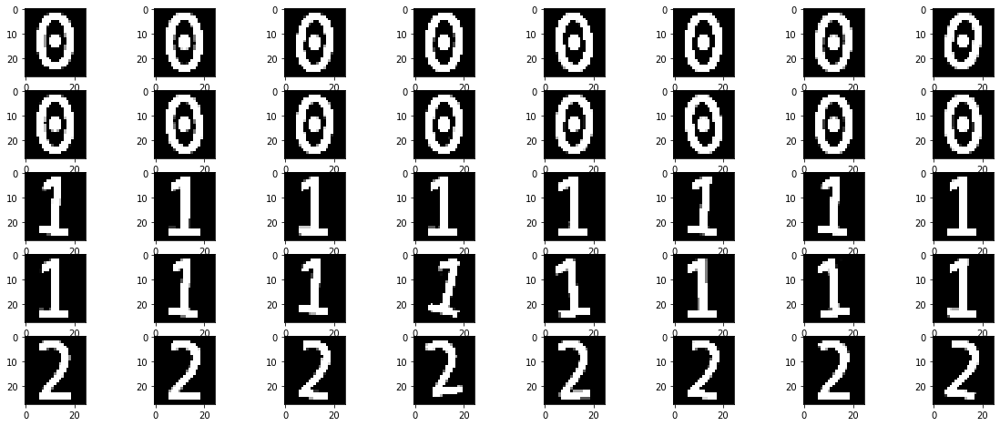

In [0]:
import matplotlib.pyplot as plt


fig, axs = plt.subplots(5, 8, figsize=(20, 8))
for i in range(len(axs)):
    for j in range(len(axs[i])):
      axs[i, j].imshow(X_train[50 * i + j].reshape((28, 25)), cmap='gray', interpolation='nearest')


## Entrenar nuestro clasificador de caracteres
Es hora de entrenar y evaluar el clasificador de caracteres que luego seráá empleado por la clase TextRecognizer.

In [0]:
from sklearn.utils import shuffle
from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import VarianceThreshold
from sklearn.pipeline import Pipeline

# Learn to predict the indices
print("--> Training classifier")
X_train, y_train = shuffle(X_train, y_train)

n_vt_cols = VarianceThreshold().fit(X_train, y_train).transform(X_train).shape[1]
clf = Pipeline([('feature_selection1',VarianceThreshold()), 
                ('feature_selection2',SelectKBest(chi2, k=round(n_vt_cols*0.95))),
                ('classification',ClassifEuclid())])

clf.fit(X_train, y_train)

print("--> Evaluating classifier")
pred = clf.predict(X_train)
accuracy = (y_train == pred).sum() / len(pred)
print("----> Training accuracy: {:.2f}%".format(100 * accuracy))

pred = clf.predict(X_test)
accuracy = (y_test == pred).sum() / len(pred)
print("----> Test Accuracy: {:.2f}%".format(100 * accuracy))

--> Training classifier
--> Evaluating classifier
----> Training accuracy: 99.54%
----> Test Accuracy: 99.57%


## Detección y reconocimiento de texto con el clasificador de caracteres

La clase TextRecognezer espera como parámetros un clasificador de caracteres y un mapping que transforme las salidas de enteros a letras.

Para hacer el reconocimiento completo de texto podríamos emplear el método **detect_image_text**, pero vamos a ejecutar paso a paso cada una de sus instrucciones para vber cómo funciona este detector de caracteres:

In [0]:
# Read the input image
tr = TextRecognizer(clf, labels)
image_path = os.path.join(resources_dir, 'EJEMPLO_PRACTICA6.JPG')

# Read the input image
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
if img is None:
    raise FileNotFoundError("Cannot find file \"{}\"".format(image_path))
assert img.shape[0] > img.shape[1], "Error: The image should be a portrait paper."

# Resize image to a fixed processing size
IMG_WIDTH = 5000.0
scale_factor = IMG_WIDTH / img.shape[1]
img = cv2.resize(img, (int(scale_factor * img.shape[1]), int(scale_factor * img.shape[0])))

# Blur image to remove some noise
blur = cv2.GaussianBlur(img, (3, 3), 1)
#plt.imshow(blur, cmap='gray')

## Binarización de la imagen de entrada
Hasta el momento lo que hemos hecho ha sido:

* Leer la imagen de entrada
* Convertirla a escala de grises
* Redimensionarla para que los caracteres tenga un tamaño considerable
* Difuminarla un poco para eliminar ruido que pueda afectar a la detección.

Para poder proceder a la detección de los caracteres tenemos que saber de forma inequívoca donde hay un caracter y donde no. Con este objetivo convertimos la image a una imagen binaria, donde los píxeles solo pueden tomar dos valores 0 y 255. Consideraremos que todos los píxeles con valor 255 son candidatos a estar en una letra.

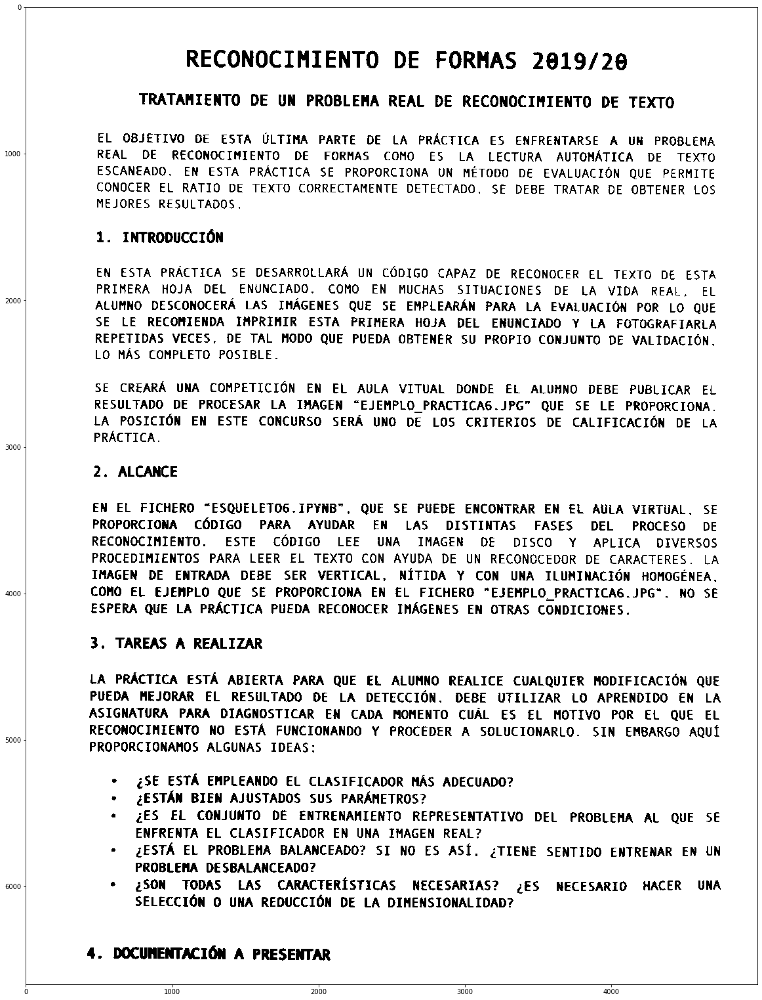

In [0]:
# Binarize image using the smart Otsu binarization method
bin_img = cv2.threshold(blur, 170, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

plt.imshow(bin_img, cmap='gray')

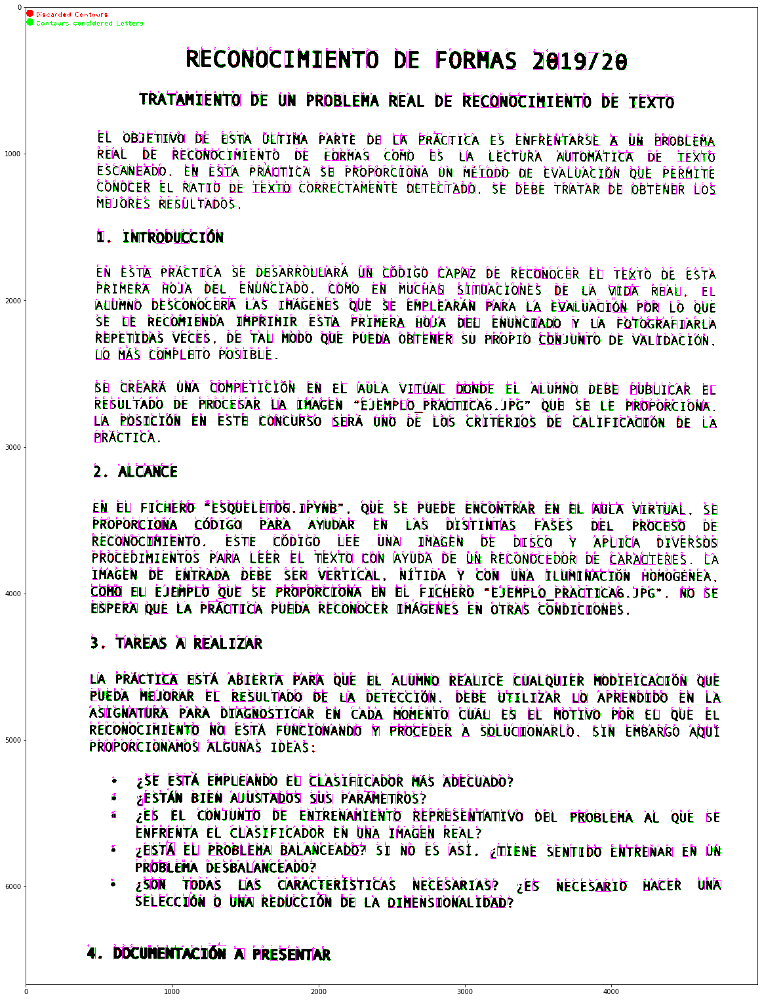

In [0]:
# Detect individual chars
char_boxes, detected_chars = tr.detect_chars(bin_img, tr.predict_char)

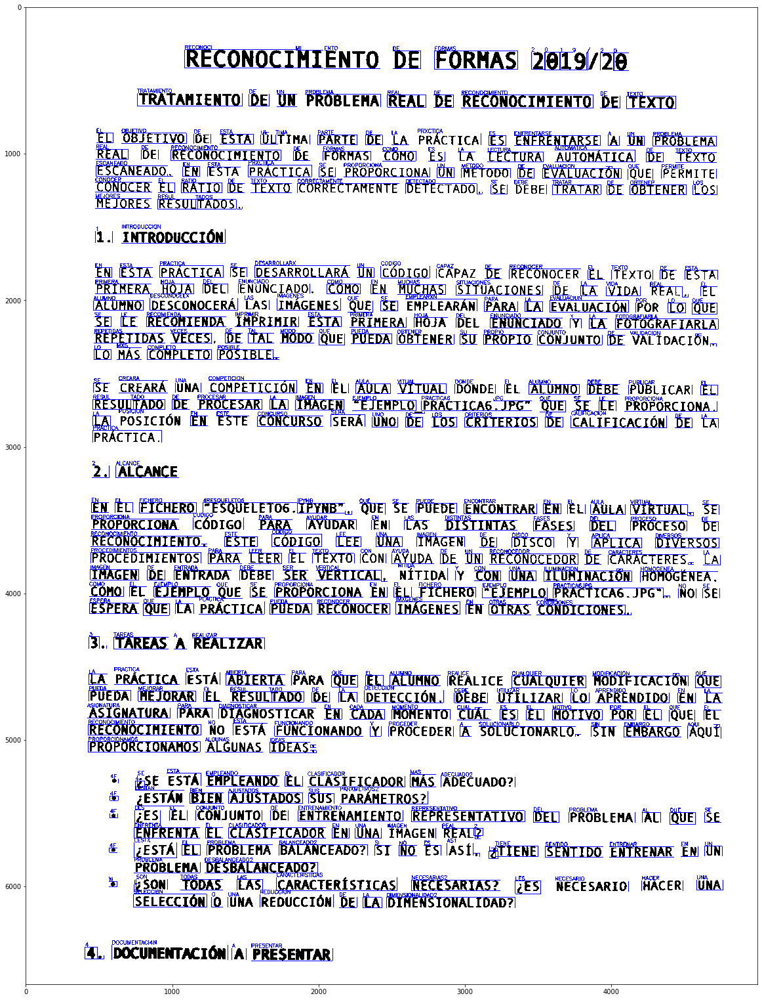

In [0]:
# Detect words based on the detected chars
word_boxes, detected_words = tr.detect_words(bin_img, char_boxes, detected_chars)

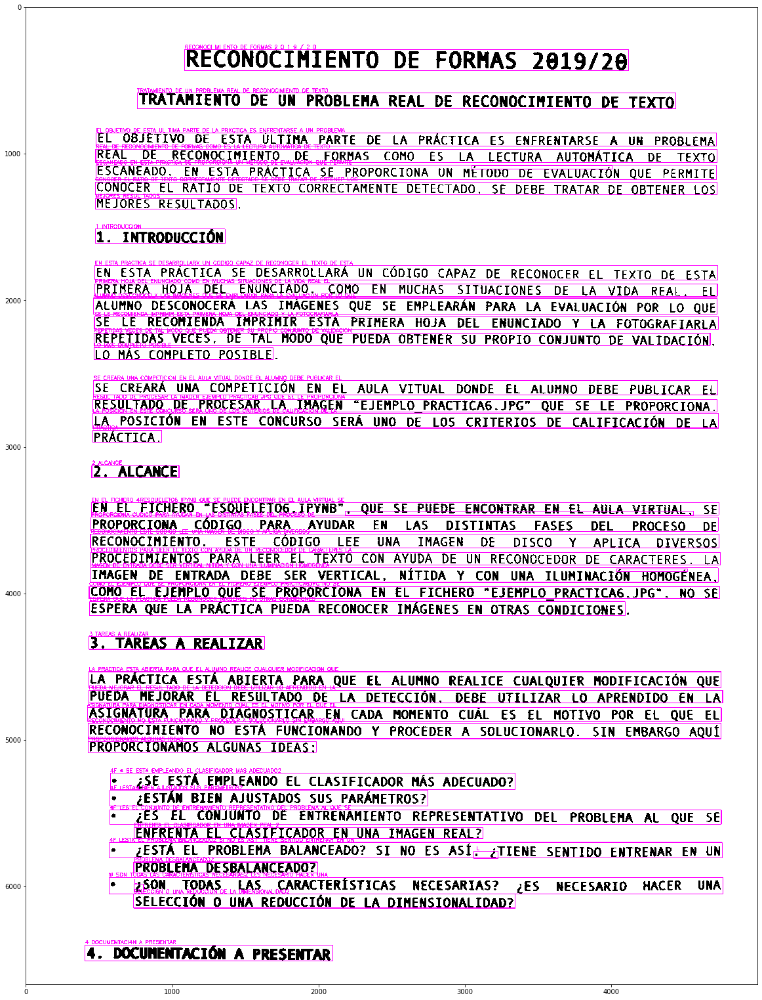

In [0]:
# Detect text lines based on the detected words
lines = tr.detect_lines(bin_img, word_boxes, detected_words)

# convert from the lines dictionary format to a string with all the text
detected_text = ''
line_words = []
for l in lines:
    line_words.append(l['words'])
    detected_text += functools.reduce(lambda a, b: a + ' ' + b, l['words']) + '\n'

## Evaluación empírica del resultado
Para evaluar el resultado obtenido en el reconocimiento del texto te proporcionamos una funcióón que te indica el ratio de texto correctamente detectado. Esta funcióón te serviráá para poder comparar los resultados de distintos clasificadores, bases de datos o características que creas que pueden mejorar el rendimiento. 

In [0]:
# ##############################################################################
# ################################# Evaluation #################################
# ##############################################################################

def evaluate_text_detection(line_words):
    """
    Evaluates the detection of the text in images.
    :param line_words: A list of lists with the line words.
    :return: A ratio of detected characters. 0 is the worse results, 1 means perfect detection.
    """
    expected_lines = [
        "RECONOCIMIENTO DE FORMAS 2019/20",
        "TRATAMIENTO DE UN PROBLEMA REAL DE RECONOCIMIENTO DE TEXTO",
        "EL OBJETIVO DE ESTA ULTIMA PARTE DE LA PRACTICA ES ENFRENTARSE A UN PROBLEMA",
        "REAL DE RECONOCIMIENTO DE FORMAS COMO ES LA LECTURA AUTOMATICA DE TEXTO",
        "ESCANEADO EN ESTA PRACTICA SE PROPORCIONA UN METODO DE EVALUACION QUE PERMITE",
        "CONOCER EL RATIO DE TEXTO CORRECTAMENTE DETECTADO SE DEBE TRATAR DE OBTENER LOS",
        "MEJORES RESULTADOS",
        "1 INTRODUCCION",
        "EN ESTA PRACTICA SE DESARROLLARA UN CODIGO CAPAZ DE RECONOCER EL TEXTO DE ESTA",
        "PRIMERA HOJA DEL ENUNCIADO COMO EN MUCHAS SITUACIONES DE LA VIDA REAL EL",
        "ALUMNO DESCONOCERA LAS IMAGENES QUE SE EMPLEARAN PARA LA EVALUACION POR LO QUE",
        "SE LE RECOMIENDA IMPRIMIR ESTA PRIMERA HOJA DEL ENUNCIADO Y LA FOTOGRAFIARLA",
        "REPETIDAS VECES DE TAL MODO QUE PUEDA OBTENER SU PROPIO CONJUNTO DE VALIDACION",
        "LO MAS COMPLETO POSIBLE",
        "SE CREARA UNA COMPETICION EN EL AULA VITUAL DONDE EL ALUMNO DEBE PUBLICAR EL",
        "RESULTADO DE PROCESAR LA IMAGEN EJEMPLO_PRACTICA6JPG QUE SE LE PROPORCIONA",
        "LA POSICION EN ESTE CONCURSO SERA UNO DE LOS CRITERIOS DE CALIFICACION DE LA",
        "PRACTICA",
        "2 ALCANCE",
        "EN EL FICHERO ESQUELETO6IPYNB QUE SE PUEDE ENCONTRAR EN EL AULA VIRTUAL SE",
        "PROPORCIONA CODIGO PARA AYUDAR EN LAS DISTINTAS FASES DEL PROCESO DE",
        "RECONOCIMIENTO ESTE CODIGO LEE UNA IMAGEN DE DISCO Y APLICA DIVERSOS",
        "PROCEDIMIENTOS PARA LEER EL TEXTO CON AYUDA DE UN RECONOCEDOR DE CARACTERES LA",
        "IMAGEN DE ENTRADA DEBE SER VERTICAL NITIDA Y CON UNA ILUMINACION HOMOGENEA",
        "COMO EL EJEMPLO QUE SE PROPORCIONA EN EL FICHERO EJEMPLO_PRACTICA6JPG NO SE",
        "ESPERA QUE LA PRACTICA PUEDA RECONOCER IMAGENES EN OTRAS CONDICIONES",
        "3 TAREAS A REALIZAR",
        "LA PRACTICA ESTA ABIERTA PARA QUE EL ALUMNO REALICE CUALQUIER MODIFICACION QUE",
        "PUEDA MEJORAR EL RESULTADO DE LA DETECCION DEBE UTILIZAR LO APRENDIDO EN LA",
        "ASIGNATURA PARA DIAGNOSTICAR EN CADA MOMENTO CUAL ES EL MOTIVO POR EL QUE EL",
        "RECONOCIMIENTO NO ESTA FUNCIONANDO Y PROCEDER A SOLUCIONARLO SIN EMBARGO AQUI",
        "PROPORCIONAMOS ALGUNAS IDEAS:",
        "¿SE ESTA EMPLEANDO EL CLASIFICADOR MAS ADECUADO?",
        "¿ESTAN BIEN AJUSTADOS SUS PARAMETROS?",
        "¿ES EL CONJUNTO DE ENTRENAMIENTO REPRESENTATIVO DEL PROBLEMA AL QUE SE",
        "ENFRENTA EL CLASIFICADOR EN UNA IMAGEN REAL?",
        "¿ESTA EL PROBLEMA BALANCEADO? SI NO ES ASI ¿TIENE SENTIDO ENTRENAR EN UN",
        "PROBLEMA DESBALANCEADO?",
        "¿SON TODAS LAS CARACTERISTICAS NECESARIAS? ¿ES NECESARIO HACER UNA",
        "SELECCION O UNA REDUCCION DE LA DIMENSIONALIDAD?",
        "4 DOCUMENTACION A PRESENTAR",
    ]

    def line_match_score(correct_line, detected_line):
        correct_line_chars = ''.join(correct_line).replace(' ', '')
        detected_line = ''.join(detected_line).replace(' ', '')
        correct_chars, correct_count = np.unique(list(correct_line_chars), return_counts=True)
        detected_chars, detected_count = np.unique(list(detected_line), return_counts=True)
        errors = 0
        for i in range(len(correct_chars)):
            n_detected = detected_count[np.argwhere(detected_chars == correct_chars[i])]
            errors += correct_count[i] if n_detected.size == 0 else abs(n_detected[0, 0] - correct_count[i])
        return 1 - errors / np.sum(correct_count)

    score_mat = np.zeros((len(expected_lines), len(line_words)))
    for i in range(len(expected_lines)):
        for j in range(len(line_words)):
            score = line_match_score(expected_lines[i], line_words[j])
            score_mat[i, j] = score

    # Take for each correct line the score of the line that best fits
    line_score = np.max(score_mat, axis=1)
    # print("Detection score for each correct line: ", line_score)
    # Assign to each line a weight proportional to its number of letters
    line_weight = np.array([len(''.join(l).replace(' ', '')) for l in expected_lines])
    line_weight = line_weight / line_weight.sum()
    return (line_weight * line_score).sum()


Por último mostramos el texto detectado y el porcentaje de tecto correctamente reconocido:

In [0]:
print("--> Result:")
print("********************************************************************************")
print(detected_text)
print("********************************************************************************")
print("Recognition percentage: {:.2f}%".format(evaluate_text_detection(line_words) * 100))

--> Result:
********************************************************************************
RECONOCI MI ENTO DE FORMAS 2 0 1 9 / 2 0
TRATAMIENTO DE UN PRDBLEMA REAL DE RECONOCIMIENTD DE TEXTO
EL OBJETIVO DE ESTA UL TIMA PARTE DE LA PRXCTICA ES ENFRENTARSE A UN PROBLEMA
REAL DE RECONOCIMIENTO DE FORMAS COMO ES LA LECTURA AUTOMATICA DE TEXTO
ESCANEADO EN ESTA PRXCTICA SE PROPORCIONA UN METODO DE EVALUACION QUE PERMITE
 
CONOCER EL RATIO DE TEXTO CORRECTAMENTE DETECTADO SE DEBE TRATAR DE OBTENEP LOS
MEJORES RESUL TADOS
1 INTRODUCCIQN
EN ESTA PRACTICA SE DESARROLLARX UN CODIGO CAPAZ DE RECONOCER EL TEXTO DE ESTA
PRIMERA HOJA DEL ENUNCIADO COMO EN MUCHAS SITUACIONES DE LA VIDA REAL EL
ALUMNO DESCONOCELX LAS IMAGENES QUE SE EMPLEARXN PARA LA EVALUACIUN POR LO QUE
SE LE RECOMIENDA IMPRIMIR ESTA PRIMERA HOJA DEL ENUNCIADO Y LA FOTOGRAFIARLA
REPETIDAS VECES DE TAL MODO QUE PUEDA OBTENER SU PROPIO CONJUNTO DE VALIDACION
LO MXS COMPLETO POSIBLE
SE CREARA UNA COMPETICION EN EL AULA VITUAL DONDE E

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:59: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


Recognition percentage: 97.33%
